# BTC-USD @5min - LSTM (close) full runs

In [ ]:
##### PARAMS:
BC5M_FILENAME = './data_clear/btc.300s.cbpro.csv'
# TL;DR change params & Kernel > Restart & Run All to "run this like a script"

In [5]:
# autoreload
%load_ext autoreload
%autoreload 1
# write code that works in both Python 2 (2.7+) and 3 (3.5+)
from __future__ import absolute_import, division, print_function, unicode_literals
try:
    input = raw_input
    range = xrange
except NameError:
    pass

In [6]:
import csv
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

import keras
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential

import pprint
pp = pprint.PrettyPrinter(indent=2).pprint
from IPython.display import display as dd
from IPython.display import Image

%matplotlib inline

Using TensorFlow backend.


In [7]:
%aimport lib.helpers
%aimport lib.etl
%aimport lib.visualization
%aimport lib.walk_forward_predict
%aimport models.rnn
%aimport models.lr
from lib.helpers import (
    timing, print_shapes, fix_all_rngs,
    date_str_to_ts
)
from lib.visualization import simple_plot
from lib.walk_forward_predict import (
    run_walk_forward_validation_rnn,
    run_walk_forward_validation_arima
)
import lib.etl as etl
from models.rnn import make_rnn_model_constructor
from models.lr import LRModel

> size: 387948


datetime    datetime64[ns]
low                float64
high               float64
open               float64
close              float64
volume             float64
dtype: object

,datetime,low,high,open,close,volume
timestamp,,,,,,
1422745200,2015-01-31 23:00:00,224.51,225.69,225.38,224.51,29.638700
1422745500,2015-01-31 23:05:00,224.00,225.59,224.62,224.00,52.189176
1422745800,2015-01-31 23:10:00,221.99,223.92,223.91,221.99,40.262566
1422746100,2015-01-31 23:15:00,218.00,222.00,222.00,218.00,163.490760
1422746400,2015-01-31 23:20:00,217.11,218.89,217.92,218.22,96.317898


,datetime,low,high,open,close,volume
timestamp,,,,,,
1539128100,2018-10-09 23:35:00,6590.30,6593.48,6591.54,6590.30,17.148190
1539128400,2018-10-09 23:40:00,6586.55,6590.31,6590.31,6589.30,15.269094
1539128700,2018-10-09 23:45:00,6589.29,6589.69,6589.30,6589.48,12.466310
1539129000,2018-10-09 23:50:00,6589.47,6592.81,6589.48,6591.85,14.972801
1539129300,2018-10-09 23:55:00,6589.47,6592.81,6591.84,6589.48,31.305392


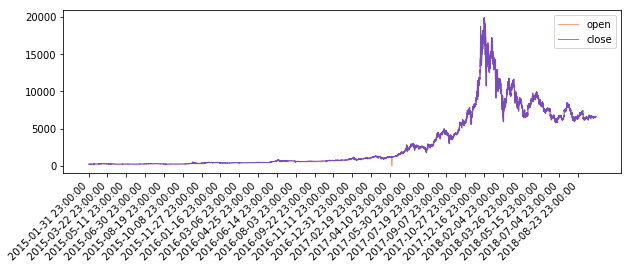

In [8]:
data5m = pd.read_csv(
    BC5M_FILENAME,
    index_col='timestamp',
    parse_dates=['datetime']
)
print('> size:', len(data5m))
dd(data5m.dtypes)
dd(data5m.head())
dd(data5m.tail())
simple_plot(data5m, xticks_span=30 * 24 * 60 // 3)

## Runs

In [9]:
DEFAULT_PARAMS = {
    # data to extract:
    'data_df': data5m,
    'features': ['close'],
    'train_sz': 25000,
    'test_sz': 3000,
    # data processing:
    'normalize': 'seqs',  # 'seqs' | 'data'
    'detrend': False,
    # model and prediction arrangement:
    'seq_len': 100,
    'pred_len': 100,
    'model_maker': make_rnn_model_constructor([100, 0.1, 50, 0.1]),
    # training:
    'epochs': 3,
    'batch_size': 512,
    'shuffle': False,
    # experiment setup:
    'times': 1,
    'skip': False,
    'fix_all_rngs_to': False,
    'fix_rngs_before_each': False,
    # plotting:
    'plot': True,
    'fig_size': (10, 8),
    'fast': True,
}

CSV_FIELDS = (
    'model_description',
    'train_from',
    'train_to',
    'test_on',
    'shuffle',
    'normalize',
    'training_loss',
    'rmse',
    'rmse_cp',
    'dir_acc',
)

In [10]:
def ddump(s):
    """Print to both notebook and system stdout."""
    os.write(1, s)
    print(s)

In [11]:
def full_run(idx_from, idx_to, write_csv_header=False):
    train_sz = DEFAULT_PARAMS['train_sz']
    test_sz = DEFAULT_PARAMS['test_sz']
    
    out_file = open(OUT_FILENAME, 'ab')
    csv_writer = csv.DictWriter(out_file, fieldnames=CSV_FIELDS)
    if write_csv_header:
        csv_writer.writeheader()
        
    with timing('full run %d - %d' % (idx_from, idx_to)):
        for i in range(idx_from, idx_to, test_sz):
            params = dict(DEFAULT_PARAMS,
                          from_i=i - train_sz)
            ddump("\n   ------ RUN %d (from %s, train on %d, test on %d)\n" % (
                i, params['from_i'], params['train_sz'], params['test_sz']))
            with timing('run segment'):
                out = run_walk_forward_validation_rnn(**params)
                csv_writer.writerow(out)
                out_file.flush()

In [12]:
# full_run(
#     25000,
#     25000 + 3000 * 2,
#     write_csv_header=True
# )


   ------ RUN 25000 (from 0, train on 25000, test on 3000)


   ------ RUN 28000 (from 3000, train on 25000, test on 3000)

--- 0.001s to full run 25000 - 31000





------ RUN 25000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140240948023248
Tensor("lstm_5_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (None, 100, 100)          40800     
_________________________________________________________________
dropout_5 (Dropout)          (None, 100, 100)          0         
_________________________________________________________________
lstm_6 (LSTM)                (None, 50)                30200     
_________________________________________________________________
dropout_6 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 51        
Total params: 71,051
Trainable params: 71,051
Non-tr

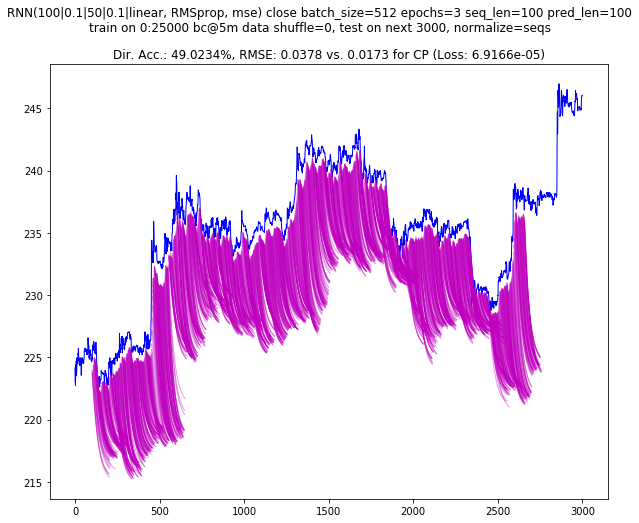

--- 436.872s to run segment



------ RUN 28000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140239284317776
Tensor("lstm_7_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 100, 100)          40800     
_________________________________________________________________
dropout_7 (Dropout)          (None, 100, 100)          0         
_________________________________________________________________
lstm_8 (LSTM)                (None, 50)                30200     
_________________________________________________________________
dropout_8 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 51        
Total params: 71,051
Tr

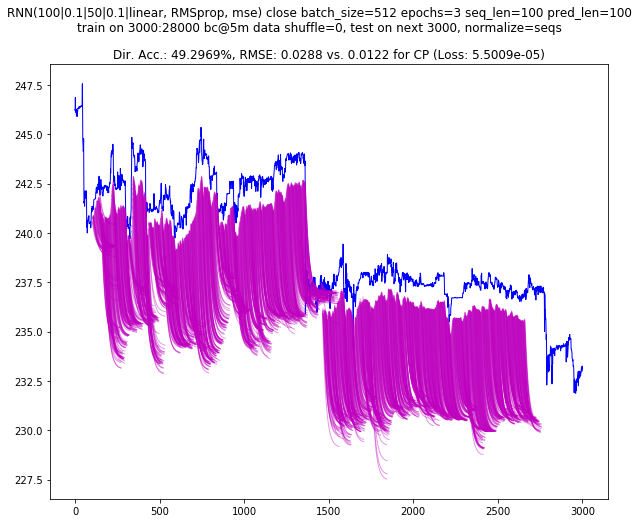

--- 437.124s to run segment



In [11]:
full_run(
    25000,
    25000 + 3000 * 2,
    write_csv_header=True
)



------ RUN 28000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238890929744
Tensor("lstm_9_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 100, 100)          40800     
_________________________________________________________________
dropout_9 (Dropout)          (None, 100, 100)          0         
_________________________________________________________________
lstm_10 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_10 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 51        
Total params: 71,051
Trainable params: 71,051
Non-tr

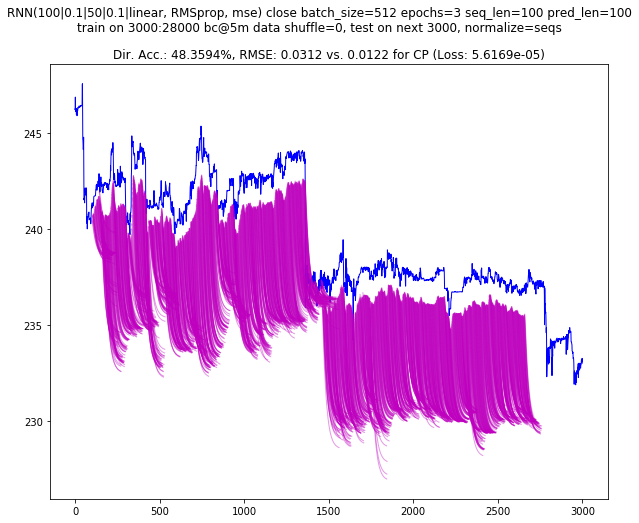

--- 438.548s to run segment



------ RUN 31000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238533555088
Tensor("lstm_11_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_11 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_11 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_12 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_12 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 51        
Total params: 71,051
T

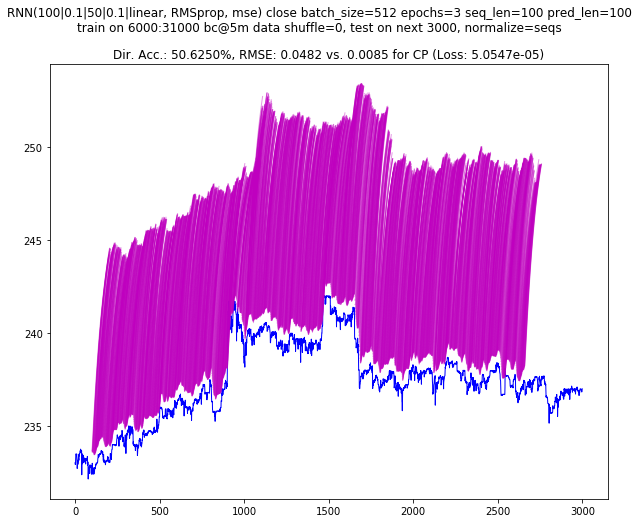

--- 440.190s to run segment



------ RUN 34000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238510291920
Tensor("lstm_13_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_13 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_13 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_14 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_14 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 51        
Total params: 71,051
T

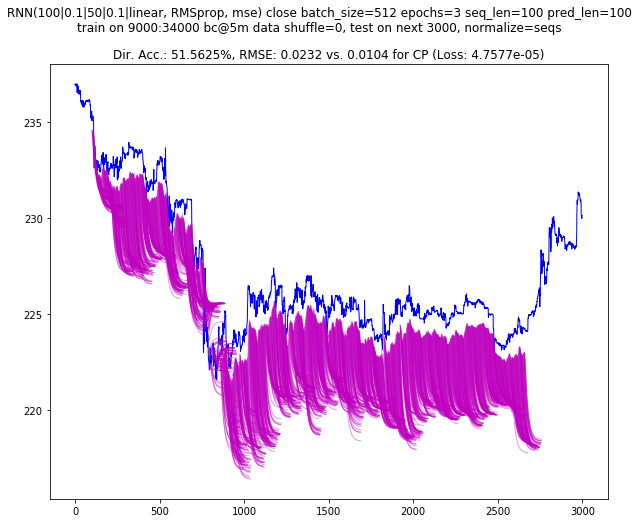

--- 440.599s to run segment



------ RUN 37000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140238526516496
Tensor("lstm_15_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_15 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_15 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_16 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_16 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 51        
Total params: 71,051
T

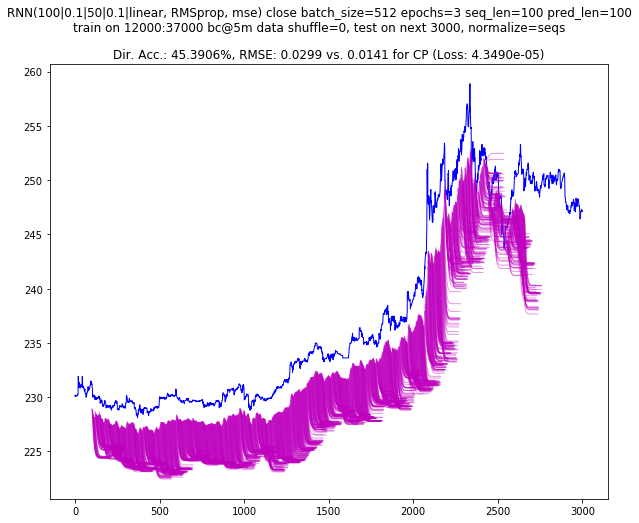

--- 442.890s to run segment



In [14]:
full_run(
    28000,
    28000 + 3000 * 4,
)



------ RUN 40000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238891635856
Tensor("lstm_17_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_17 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_17 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_18 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_18 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 51        
Total params: 71,051
Trainable params: 71,051
Non-t

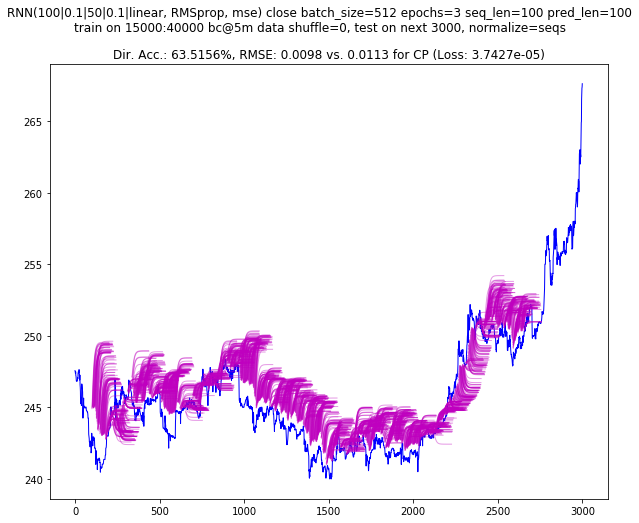

--- 439.782s to run segment



------ RUN 43000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140238903360720
Tensor("lstm_19_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_19 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_19 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_20 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_20 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 51        
Total params: 71,051
T

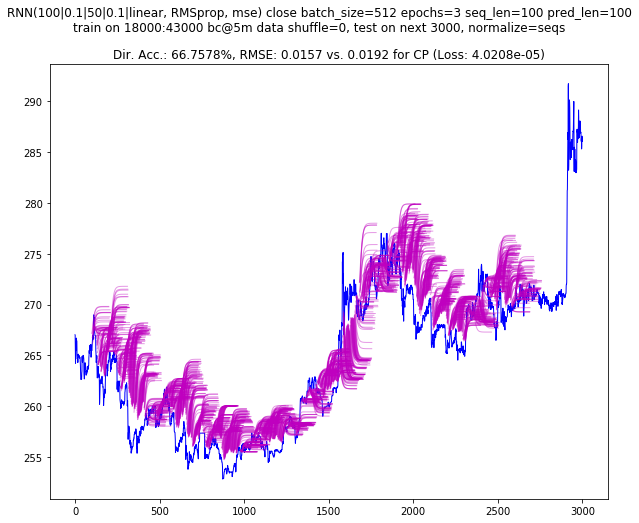

--- 440.717s to run segment



------ RUN 46000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238390134480
Tensor("lstm_21_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_21 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_21 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_22 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_22 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 51        
Total params: 71,051
T

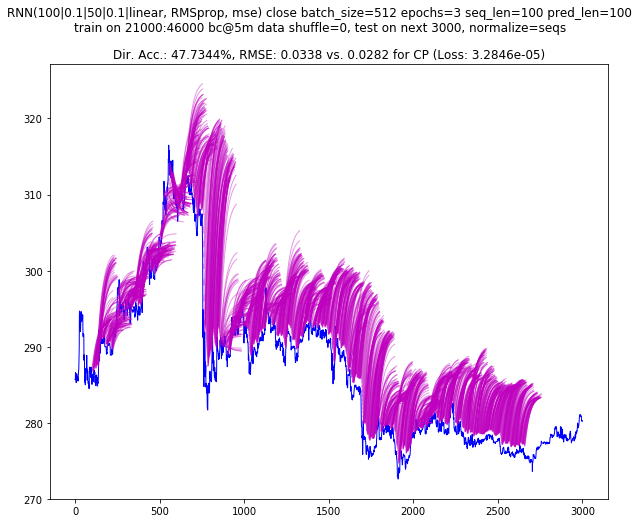

--- 440.908s to run segment



------ RUN 49000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140238401068304
Tensor("lstm_23_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_23 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_23 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_24 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_24 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 51        
Total params: 71,051
T

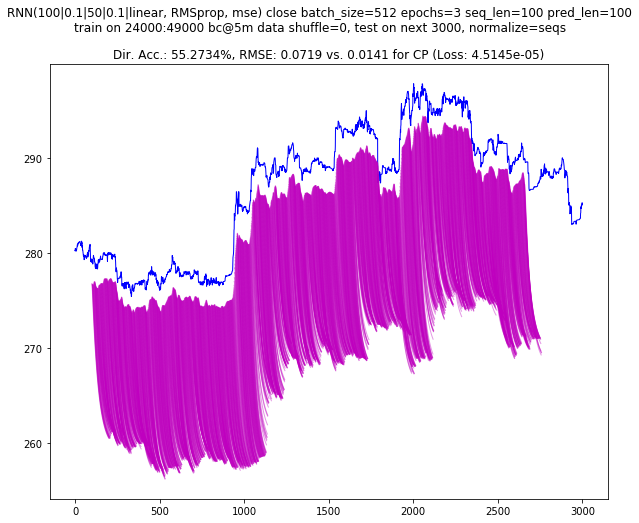

--- 437.297s to run segment



------ RUN 52000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238376656464
Tensor("lstm_25_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_25 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_25 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_26 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_26 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 51        
Total params: 71,051
T

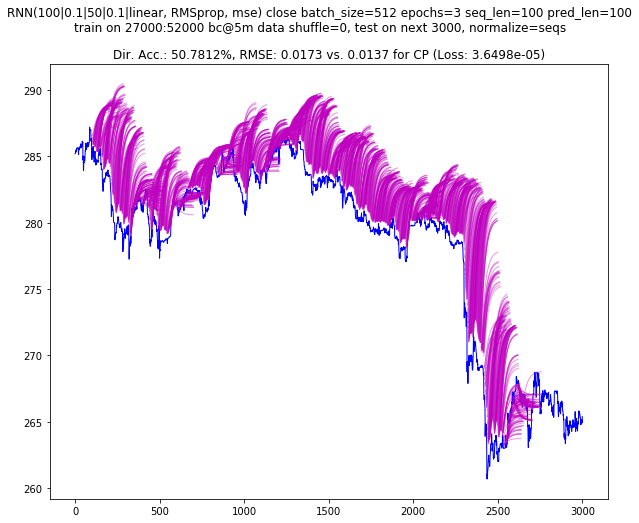

--- 440.145s to run segment



------ RUN 55000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140238433591760
Tensor("lstm_27_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_27 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_27 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_28 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_28 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 51        
Total params: 71,051
T

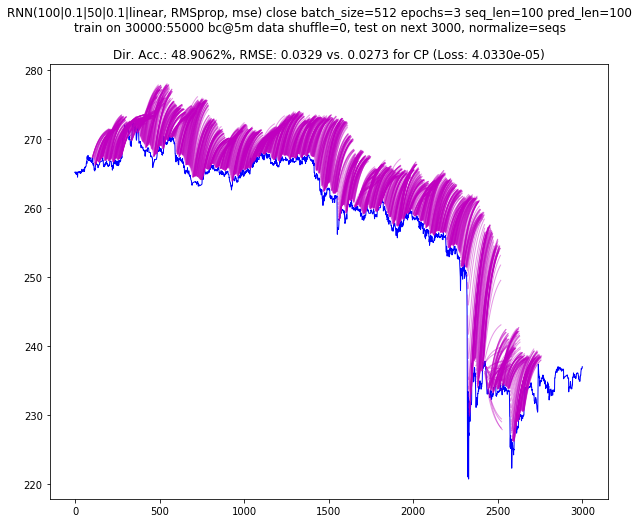

--- 438.367s to run segment



------ RUN 58000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238294842896
Tensor("lstm_29_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_29 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_29 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_30 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_30 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 51        
Total params: 71,051
T

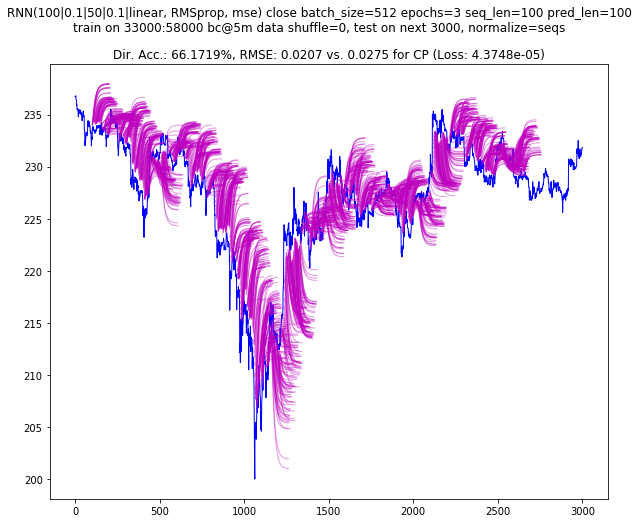

--- 442.754s to run segment



------ RUN 61000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238342861904
Tensor("lstm_31_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_31 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_31 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_32 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_32 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_16 (Dense)             (None, 1)                 51        
Total params: 71,051
T

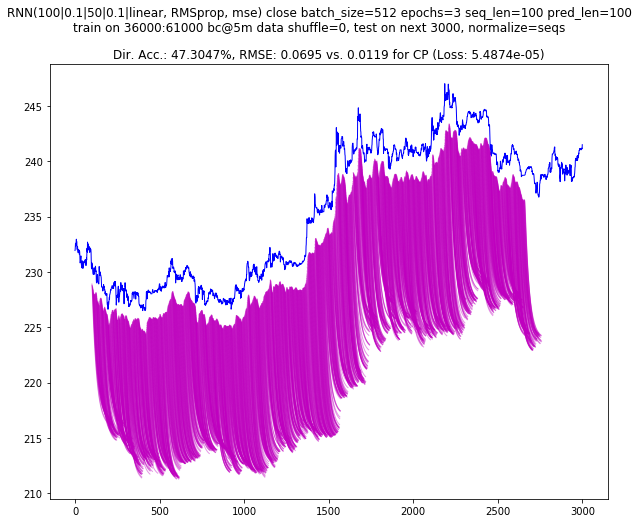

--- 439.958s to run segment



------ RUN 64000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238247618640
Tensor("lstm_33_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_33 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_33 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_34 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_34 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 51        
Total params: 71,051
T

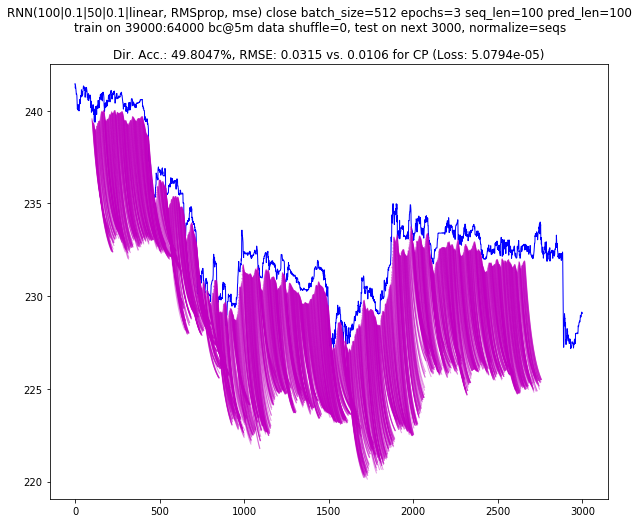

--- 443.478s to run segment



------ RUN 67000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238346291792
Tensor("lstm_35_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_35 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_35 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_36 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_36 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_18 (Dense)             (None, 1)                 51        
Total params: 71,051
T

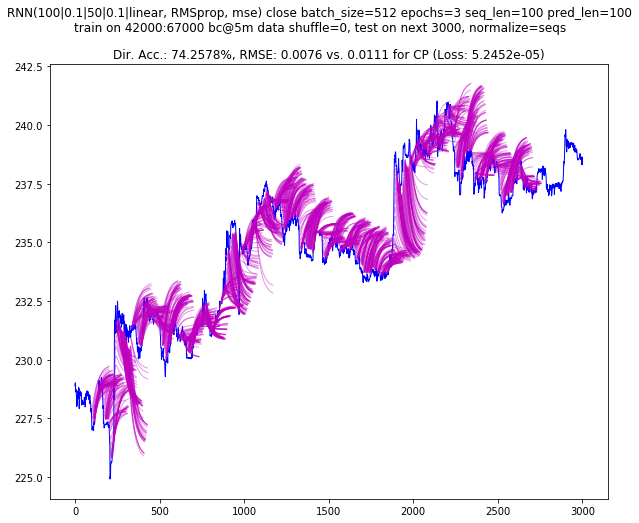

--- 441.669s to run segment



------ RUN 70000 ------

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238202402960
Tensor("lstm_37_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_37 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_37 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_38 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_38 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 51        
Total params: 71,051
T

In [ ]:
full_run(
    40000,
    40000 + 3000 * 16,
)


   ------ RUN 88000 (from 63000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238092045136
Tensor("lstm_51_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_51 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_51 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_52 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_52 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_26 (Dense)             (None, 1)                 51        
Total params:

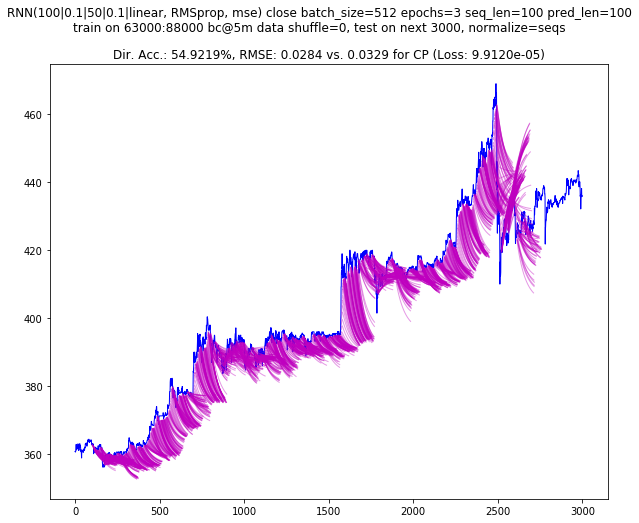

--- 445.727s to run segment


   ------ RUN 91000 (from 66000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238020295696
Tensor("lstm_53_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_53 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_53 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_54 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_54 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_27 (Dense)             (None, 1)            

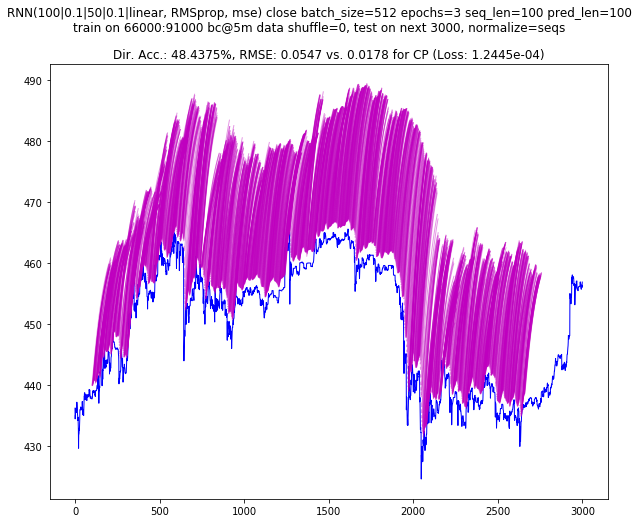

--- 443.053s to run segment


   ------ RUN 94000 (from 69000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140237963451344
Tensor("lstm_55_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_55 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_55 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_56 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_56 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_28 (Dense)             (None, 1)            

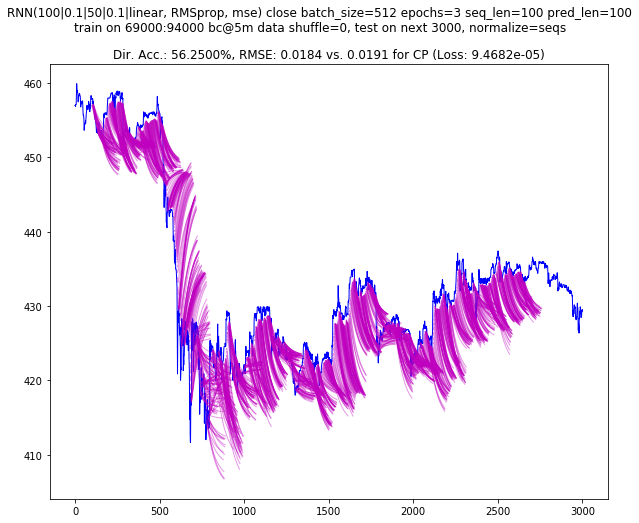

--- 446.905s to run segment


   ------ RUN 97000 (from 72000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140238051322128
Tensor("lstm_57_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_57 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_57 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_58 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_58 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_29 (Dense)             (None, 1)            

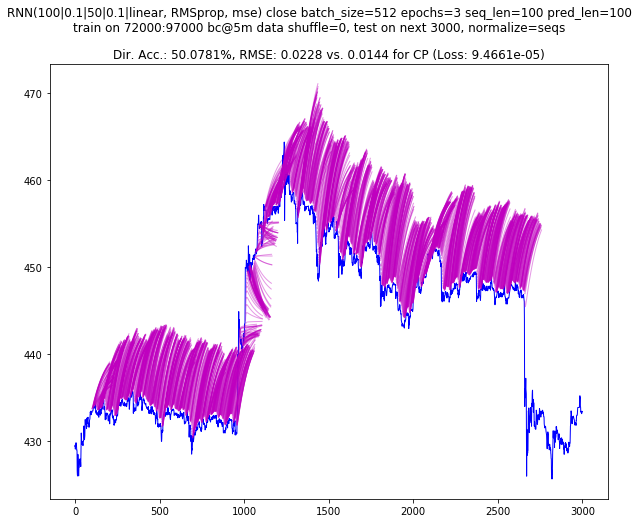

--- 445.927s to run segment


   ------ RUN 100000 (from 75000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237966117328
Tensor("lstm_59_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_59 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_59 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_60 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_60 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_30 (Dense)             (None, 1)           

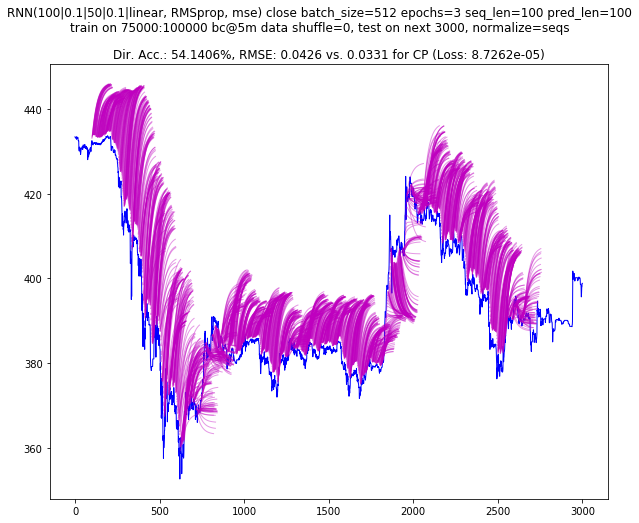

--- 447.844s to run segment


   ------ RUN 103000 (from 78000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237895051472
Tensor("lstm_61_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_61 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_61 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_62 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_62 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_31 (Dense)             (None, 1)           

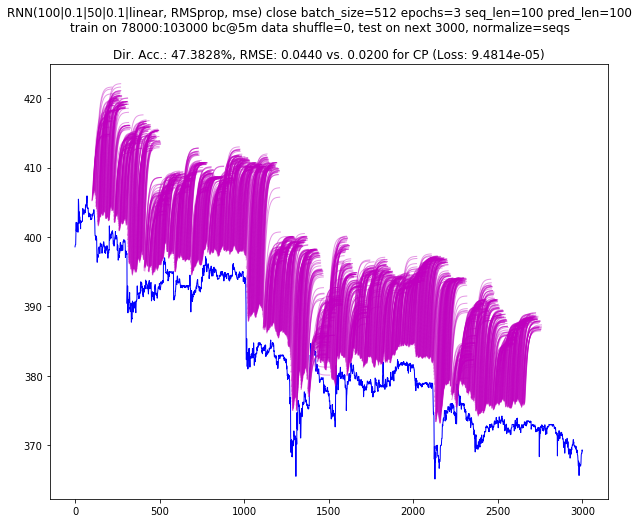

--- 448.326s to run segment


   ------ RUN 106000 (from 81000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140238025288336
Tensor("lstm_63_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_63 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_63 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_64 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_64 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_32 (Dense)             (None, 1)           

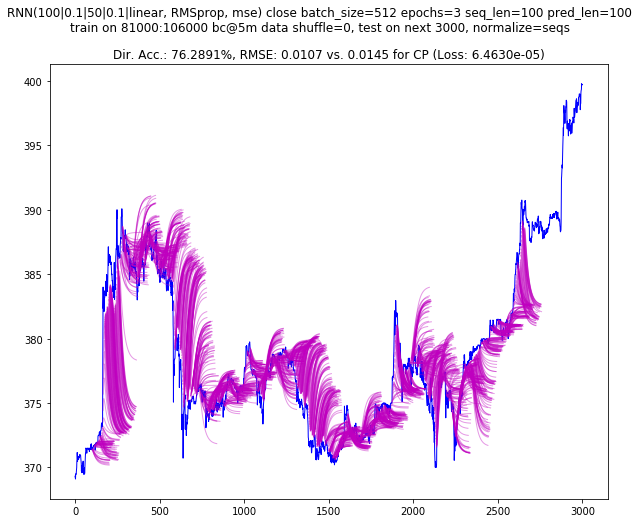

--- 448.041s to run segment


   ------ RUN 109000 (from 84000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237919813072
Tensor("lstm_65_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_65 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_65 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_66 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_66 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_33 (Dense)             (None, 1)           

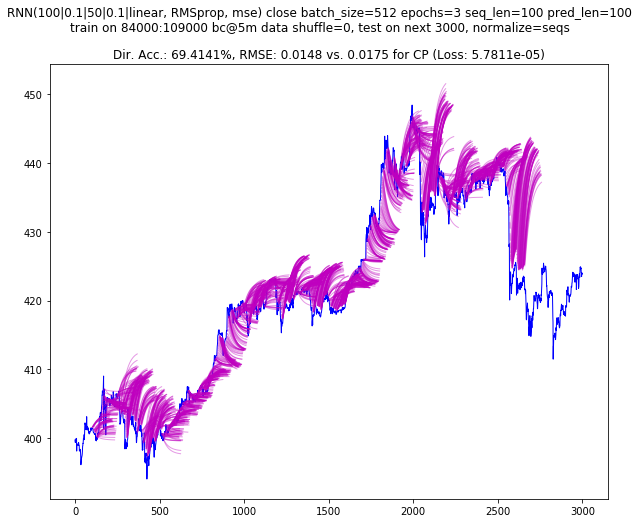

--- 484.367s to run segment

--- 3610.193s to full run 88000 - 112000



In [31]:
full_run(
    88000,
    88000 + 3000 * 8,
)


   ------ RUN 112000 (from 87000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.017s to model compilation time


--- Created model id: 140237826281168
Tensor("lstm_67_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_67 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_67 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_68 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_68 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_34 (Dense)             (None, 1)                 51        
Total params

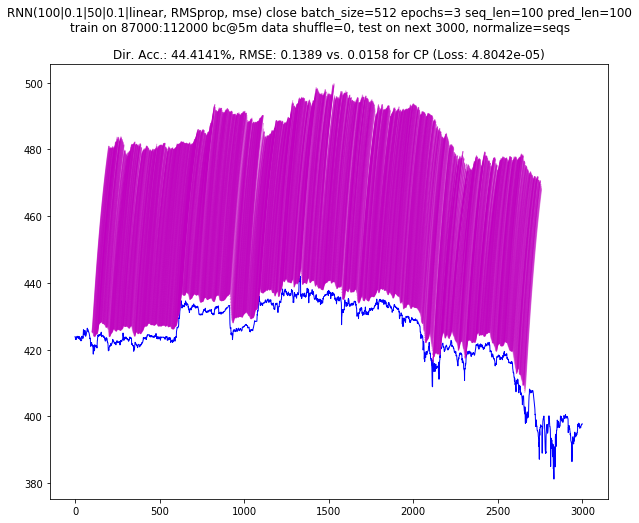

--- 544.165s to run segment


   ------ RUN 115000 (from 90000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.018s to model compilation time


--- Created model id: 140237771500304
Tensor("lstm_69_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_69 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_69 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_70 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_70 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_35 (Dense)             (None, 1)           

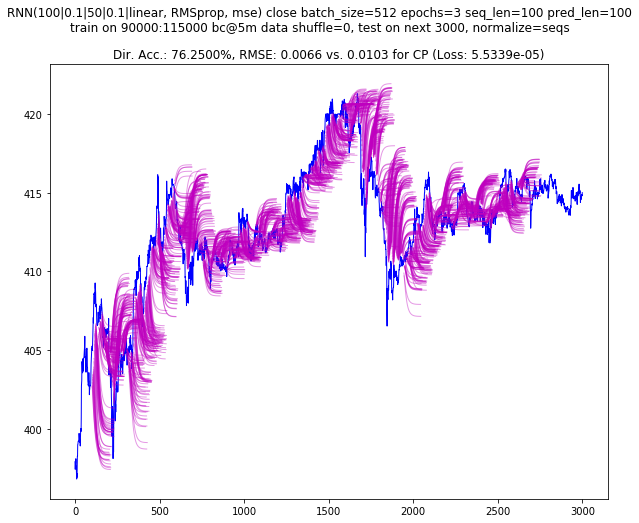

--- 555.481s to run segment


   ------ RUN 118000 (from 93000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.018s to model compilation time


--- Created model id: 140237987310992
Tensor("lstm_71_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_71 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_71 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_72 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_72 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_36 (Dense)             (None, 1)           

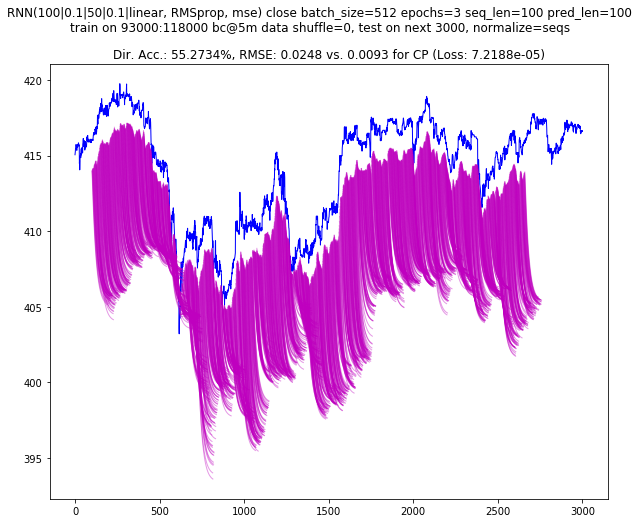

--- 550.348s to run segment


   ------ RUN 121000 (from 96000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.019s to model compilation time


--- Created model id: 140237838946960
Tensor("lstm_73_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_73 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_73 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_74 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_74 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_37 (Dense)             (None, 1)           

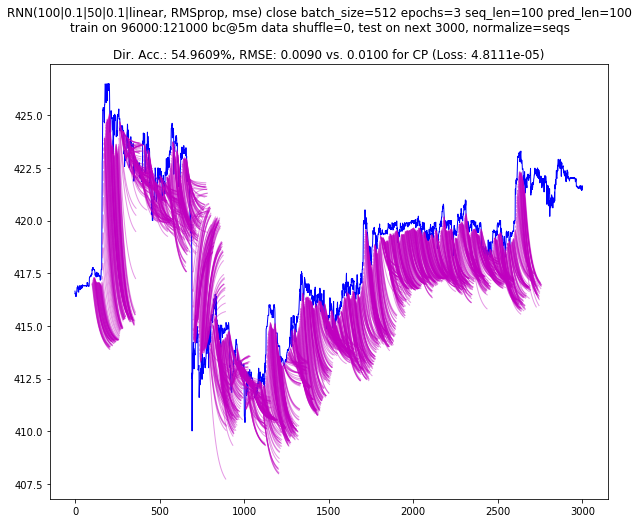

--- 548.936s to run segment


   ------ RUN 124000 (from 99000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.020s to model compilation time


--- Created model id: 140237739849488
Tensor("lstm_75_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_75 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_75 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_76 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_76 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_38 (Dense)             (None, 1)           

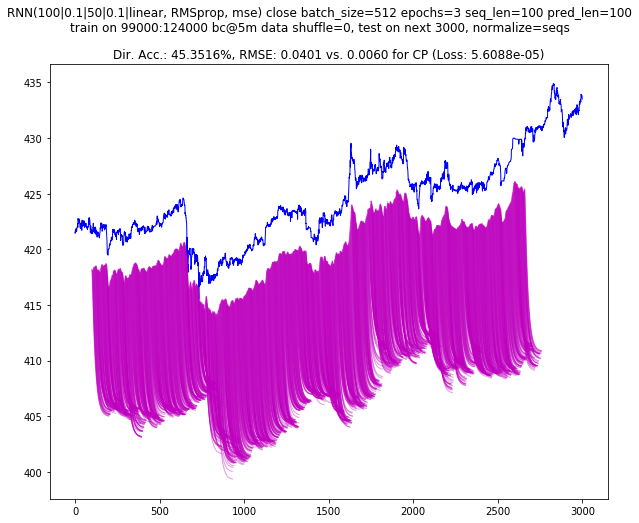

--- 547.100s to run segment


   ------ RUN 127000 (from 102000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.019s to model compilation time


--- Created model id: 140237679606736
Tensor("lstm_77_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_77 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_77 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_78 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_78 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_39 (Dense)             (None, 1)          

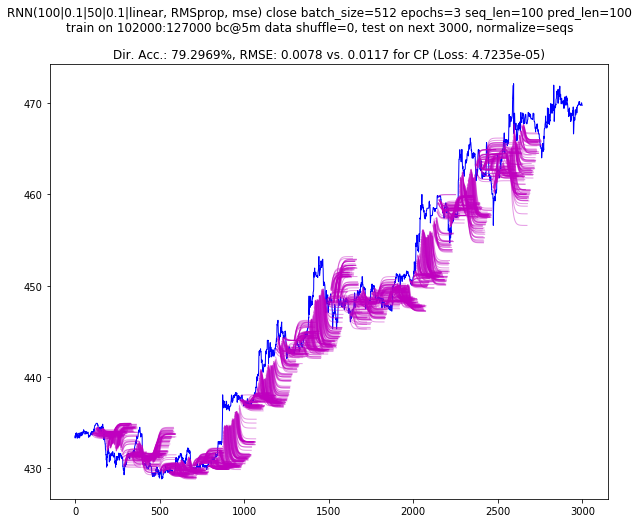

--- 564.108s to run segment


   ------ RUN 130000 (from 105000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.019s to model compilation time


--- Created model id: 140237989128912
Tensor("lstm_79_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_79 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_79 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_80 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_80 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_40 (Dense)             (None, 1)          

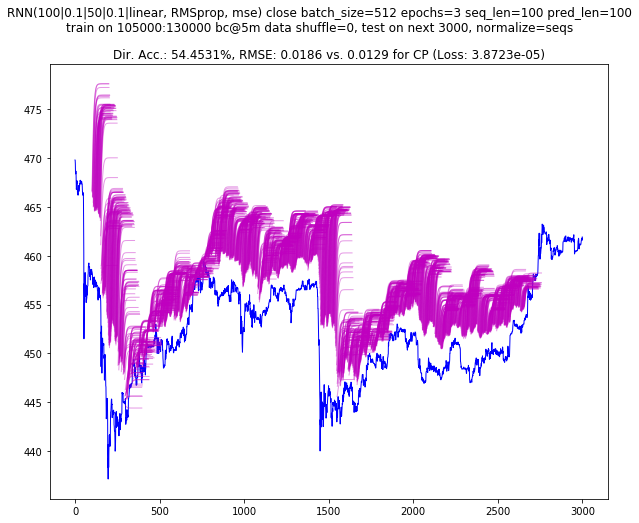

--- 571.369s to run segment


   ------ RUN 133000 (from 108000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.018s to model compilation time


--- Created model id: 140237777981264
Tensor("lstm_81_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_81 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_81 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_82 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_82 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_41 (Dense)             (None, 1)          

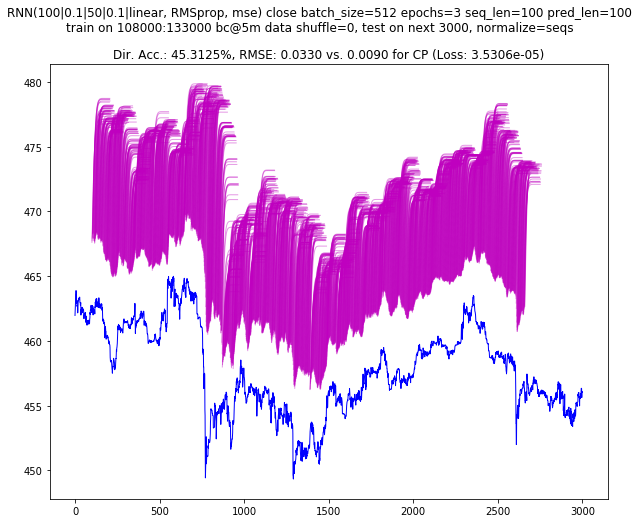

--- 564.401s to run segment

--- 4445.910s to full run 112000 - 136000



In [32]:
start_at = 88000 + 3000 * 8
full_run(
    start_at,
    start_at + 3000 * 8,
)


   ------ RUN 136000 (from 111000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.017s to model compilation time


--- Created model id: 140237644037328
Tensor("lstm_83_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_83 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_83 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_84 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_84 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_42 (Dense)             (None, 1)                 51        
Total param

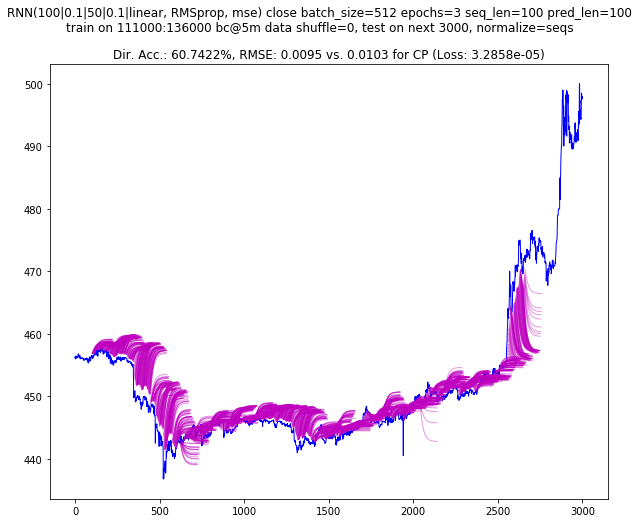

--- 567.389s to run segment


   ------ RUN 139000 (from 114000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.018s to model compilation time


--- Created model id: 140237587156176
Tensor("lstm_85_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_85 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_85 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_86 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_86 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_43 (Dense)             (None, 1)          

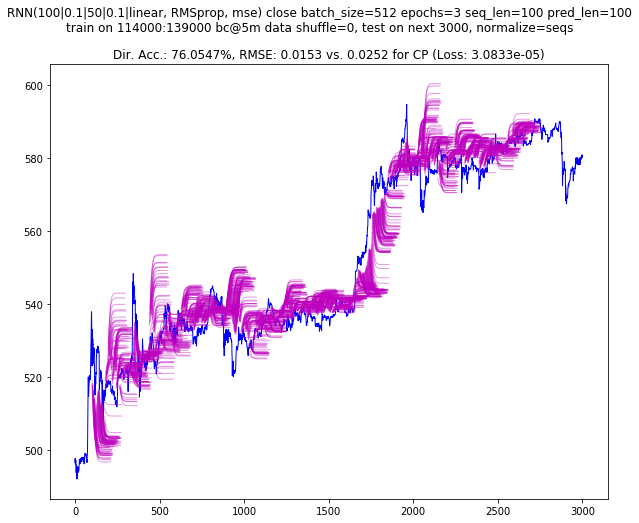

--- 573.080s to run segment


   ------ RUN 142000 (from 117000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.019s to model compilation time


--- Created model id: 140237535785744
Tensor("lstm_87_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_87 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_87 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_88 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_88 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_44 (Dense)             (None, 1)          

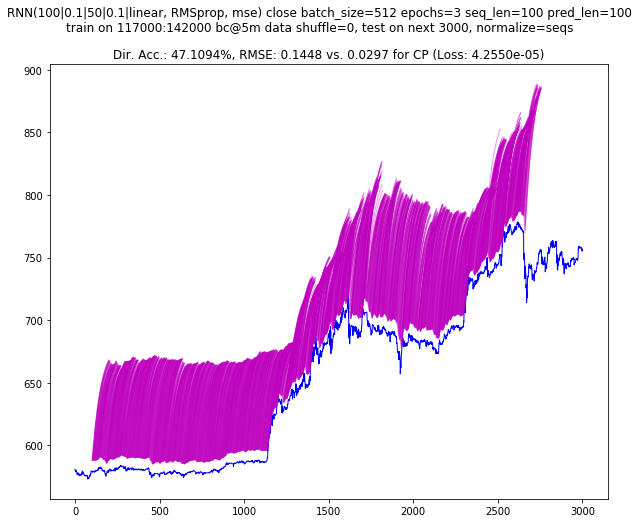

--- 575.245s to run segment


   ------ RUN 145000 (from 120000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.018s to model compilation time


--- Created model id: 140237648121232
Tensor("lstm_89_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_89 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_89 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_90 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_90 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_45 (Dense)             (None, 1)          

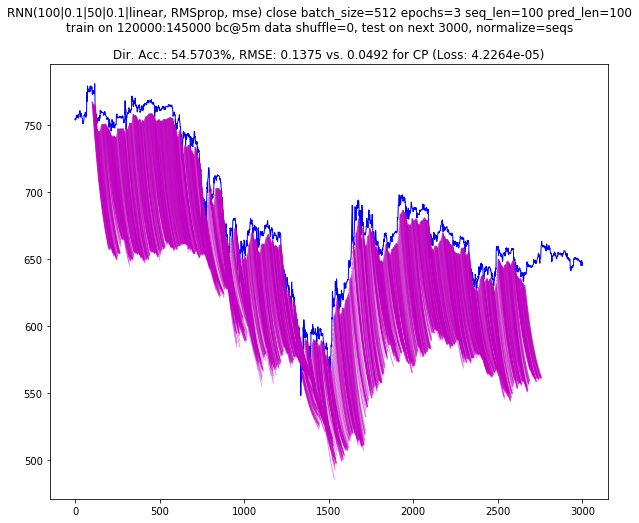

--- 573.159s to run segment


   ------ RUN 148000 (from 123000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.020s to model compilation time


--- Created model id: 140237649607440
Tensor("lstm_91_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_91 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_91 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_92 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_92 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_46 (Dense)             (None, 1)          

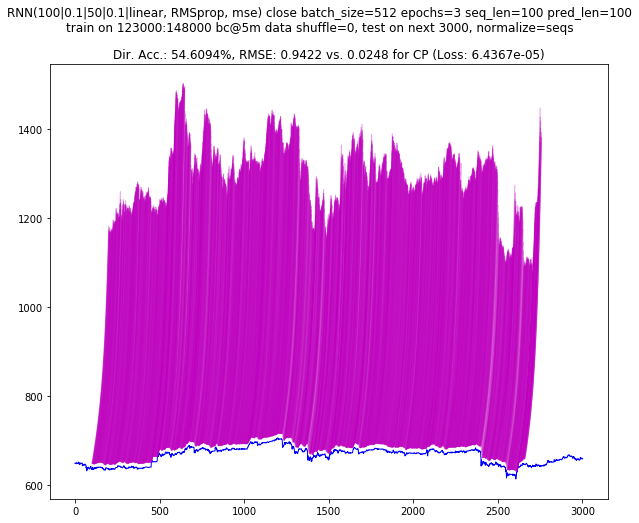

--- 569.198s to run segment


   ------ RUN 151000 (from 126000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140237543455312
Tensor("lstm_93_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_93 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_93 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_94 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_94 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_47 (Dense)             (None, 1)          

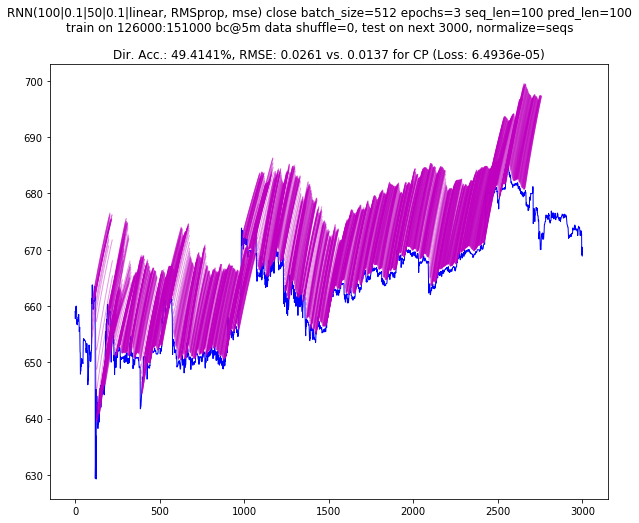

--- 496.655s to run segment


   ------ RUN 154000 (from 129000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.017s to model compilation time


--- Created model id: 140237473757328
Tensor("lstm_95_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_95 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_95 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_96 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_96 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 1)          

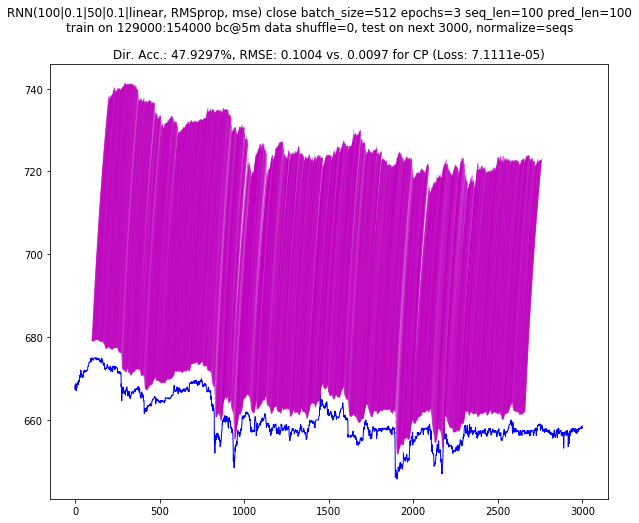

--- 495.256s to run segment


   ------ RUN 157000 (from 132000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.017s to model compilation time


--- Created model id: 140237416872208
Tensor("lstm_97_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_97 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_97 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_98 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dropout_98 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_49 (Dense)             (None, 1)          

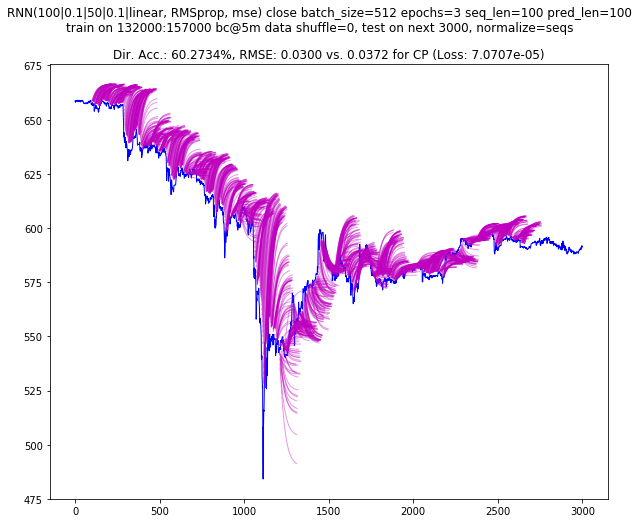

--- 500.457s to run segment

--- 4350.441s to full run 136000 - 160000



In [38]:
start_at = 136000
full_run(
    start_at,
    start_at + 3000 * 8,
)


   ------ RUN 160000 (from 135000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.017s to model compilation time


--- Created model id: 140237783638608
Tensor("lstm_99_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_99 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
dropout_99 (Dropout)         (None, 100, 100)          0         
_________________________________________________________________
lstm_100 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_100 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_50 (Dense)             (None, 1)                 51        
Total param

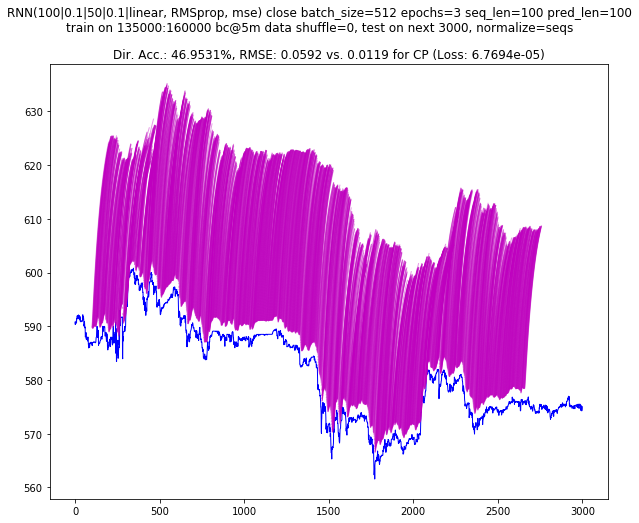

--- 506.784s to run segment


   ------ RUN 163000 (from 138000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.017s to model compilation time


--- Created model id: 140237557971088
Tensor("lstm_101_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_101 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_101 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_102 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_102 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_51 (Dense)             (None, 1)         

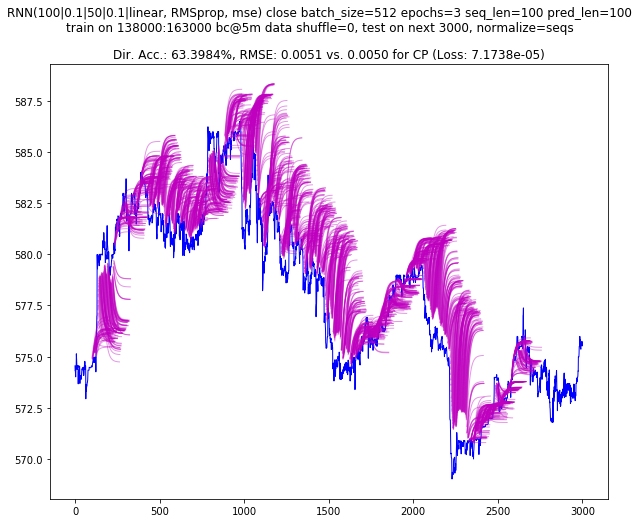

--- 496.917s to run segment


   ------ RUN 166000 (from 141000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.018s to model compilation time


--- Created model id: 140237435338192
Tensor("lstm_103_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_103 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_103 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_104 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_104 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_52 (Dense)             (None, 1)         

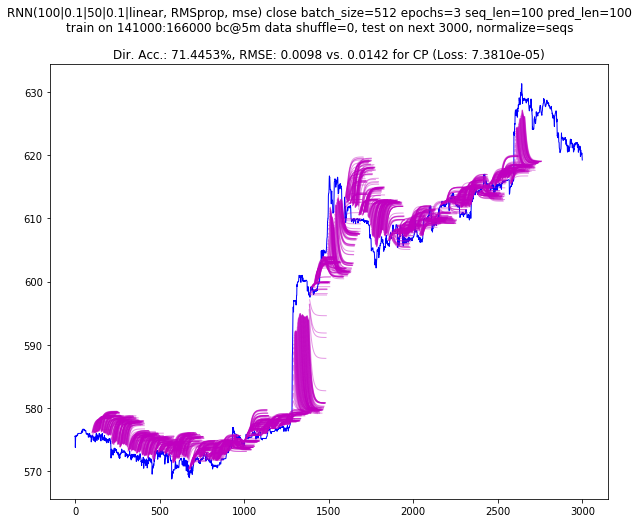

--- 484.464s to run segment


   ------ RUN 169000 (from 144000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237359894352
Tensor("lstm_105_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_105 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_105 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_106 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_106 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_53 (Dense)             (None, 1)         

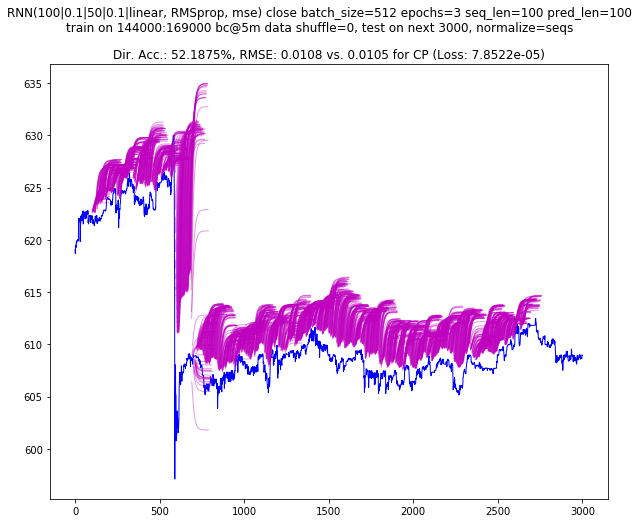

--- 448.488s to run segment


   ------ RUN 172000 (from 147000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237306400080
Tensor("lstm_107_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_107 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_107 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_108 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_108 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_54 (Dense)             (None, 1)         

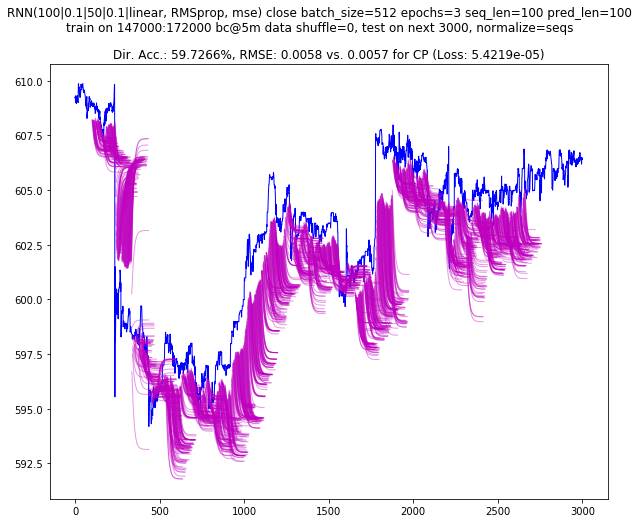

--- 448.176s to run segment


   ------ RUN 175000 (from 150000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140237246217104
Tensor("lstm_109_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_109 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_109 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_110 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_110 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_55 (Dense)             (None, 1)         

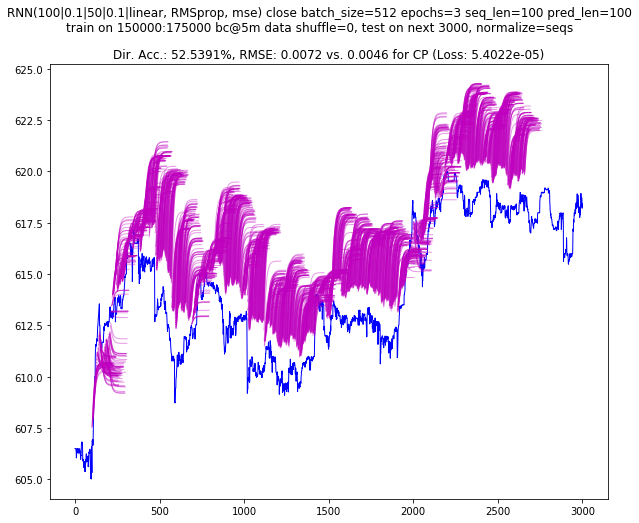

--- 455.851s to run segment


   ------ RUN 178000 (from 153000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237337390416
Tensor("lstm_111_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_111 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_111 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_112 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_112 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_56 (Dense)             (None, 1)         

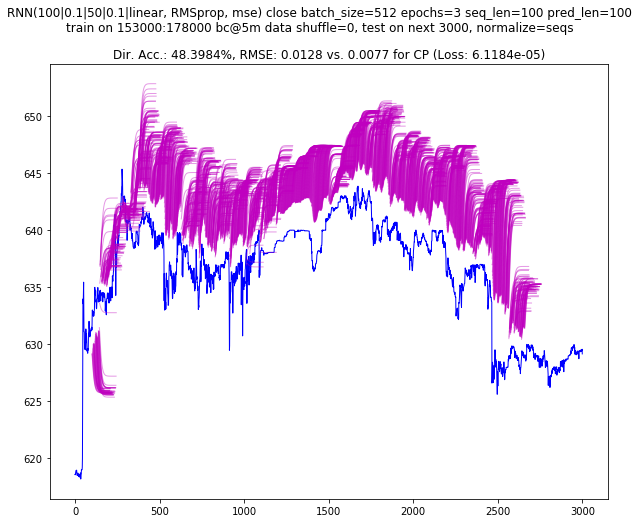

--- 454.069s to run segment


   ------ RUN 181000 (from 156000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237445115536
Tensor("lstm_113_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_113 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_113 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_114 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_114 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_57 (Dense)             (None, 1)         

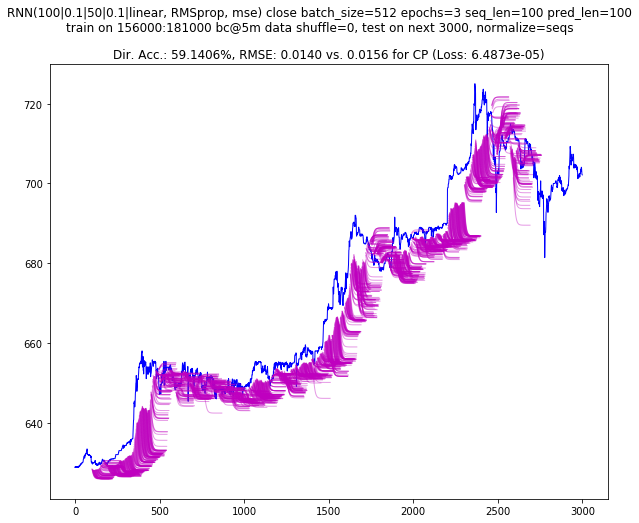

--- 453.161s to run segment

--- 3747.912s to full run 160000 - 184000



In [39]:
start_at = 160000
full_run(
    start_at,
    start_at + 3000 * 8,
)


   ------ RUN 184000 (from 159000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237314099536
Tensor("lstm_115_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_115 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_115 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_116 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_116 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_58 (Dense)             (None, 1)                 51        
Total para

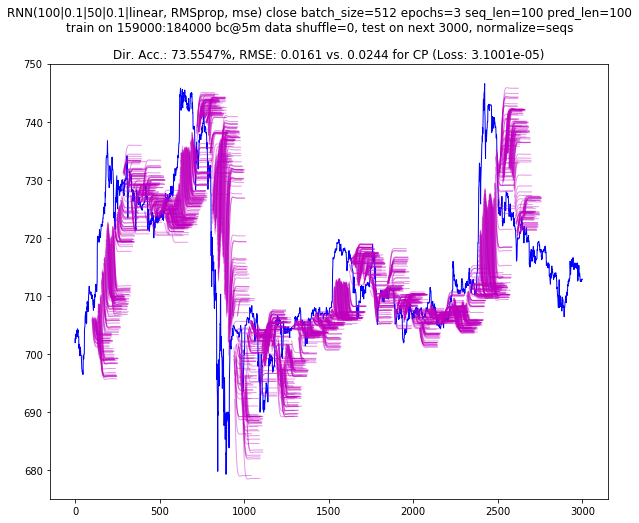

--- 451.632s to run segment


   ------ RUN 187000 (from 162000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237220510288
Tensor("lstm_117_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_117 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_117 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_118 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_118 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_59 (Dense)             (None, 1)         

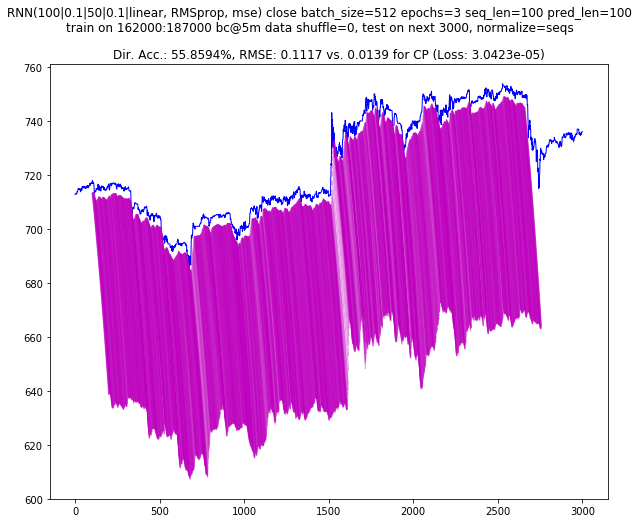

--- 451.992s to run segment


   ------ RUN 190000 (from 165000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237165591760
Tensor("lstm_119_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_119 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_119 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_120 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_120 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_60 (Dense)             (None, 1)         

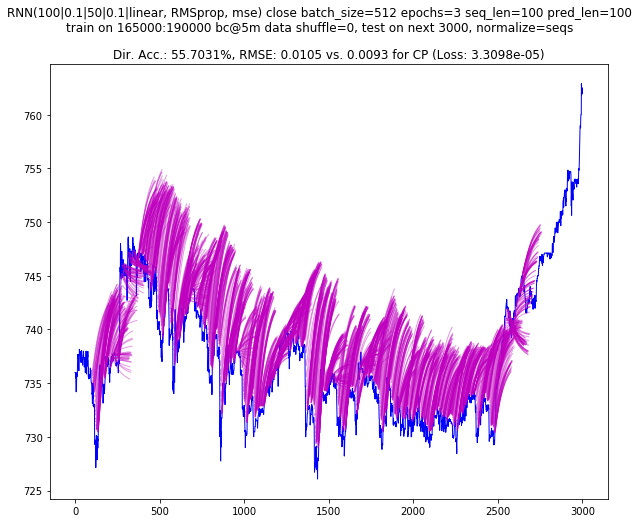

--- 449.849s to run segment


   ------ RUN 193000 (from 168000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140237112137680
Tensor("lstm_121_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_121 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_121 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_122 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_122 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_61 (Dense)             (None, 1)         

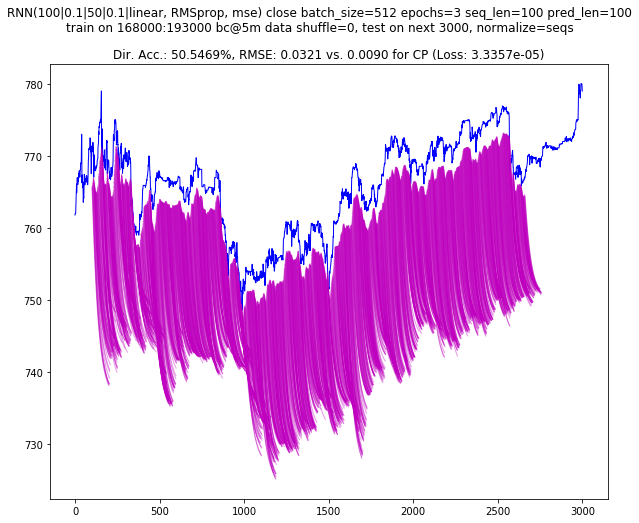

--- 455.821s to run segment


   ------ RUN 196000 (from 171000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237782090832
Tensor("lstm_123_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_123 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_123 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_124 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_124 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_62 (Dense)             (None, 1)         

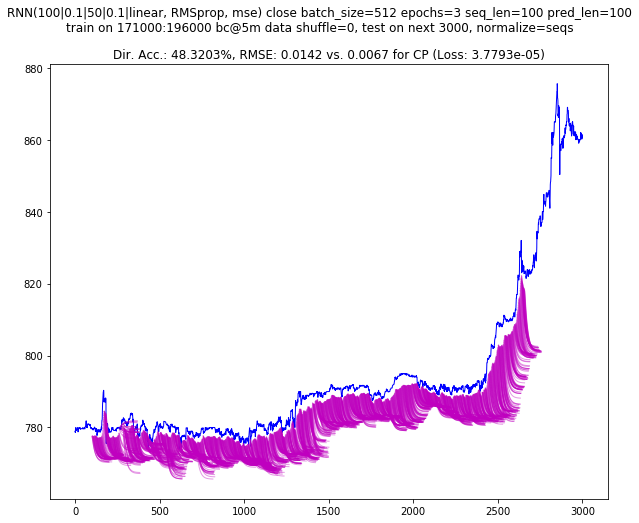

--- 452.330s to run segment


   ------ RUN 199000 (from 174000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237445980048
Tensor("lstm_125_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_125 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_125 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_126 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_126 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_63 (Dense)             (None, 1)         

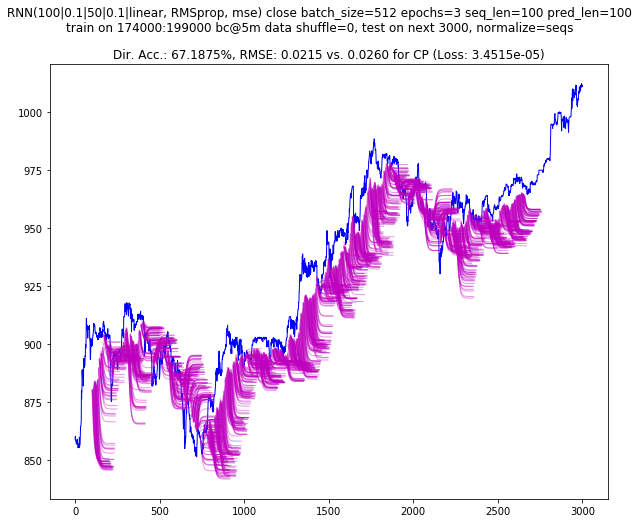

--- 450.747s to run segment


   ------ RUN 202000 (from 177000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237227921616
Tensor("lstm_127_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_127 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_127 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_128 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_128 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_64 (Dense)             (None, 1)         

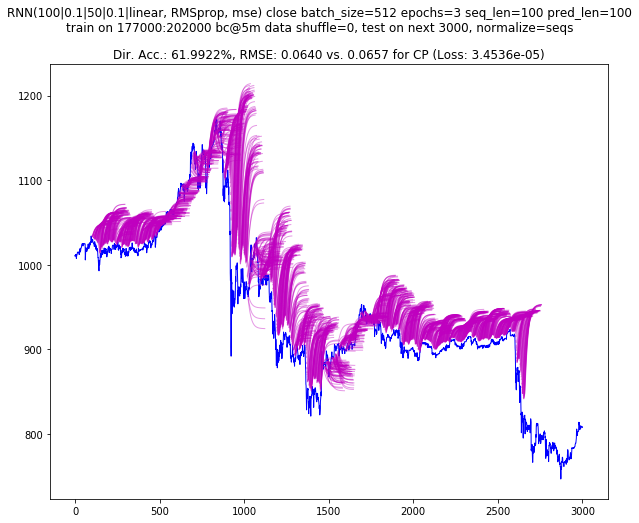

--- 453.143s to run segment


   ------ RUN 205000 (from 180000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237121564496
Tensor("lstm_129_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_129 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_129 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_130 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_130 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_65 (Dense)             (None, 1)         

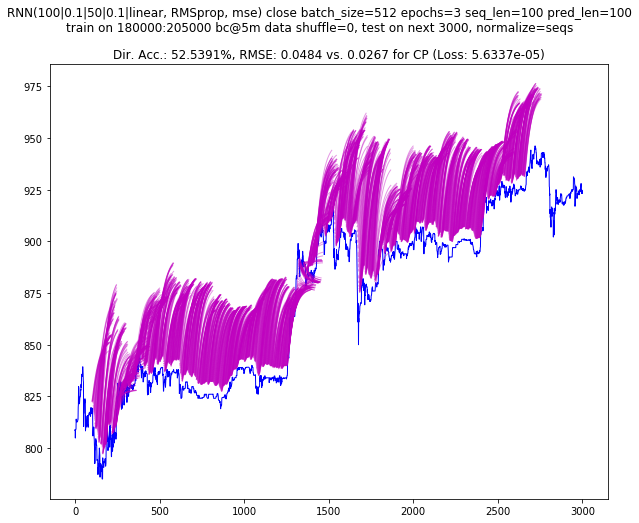

--- 454.128s to run segment


   ------ RUN 208000 (from 183000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237031934736
Tensor("lstm_131_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_131 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_131 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_132 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_132 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_66 (Dense)             (None, 1)         

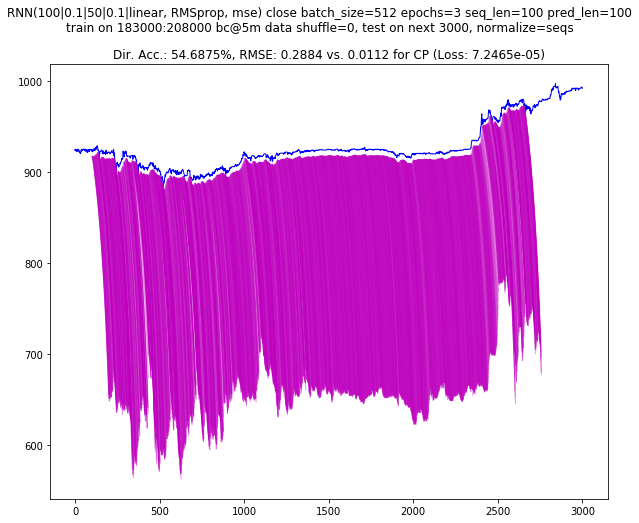

--- 455.076s to run segment


   ------ RUN 211000 (from 186000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236971694928
Tensor("lstm_133_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_133 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_133 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_134 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_134 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_67 (Dense)             (None, 1)         

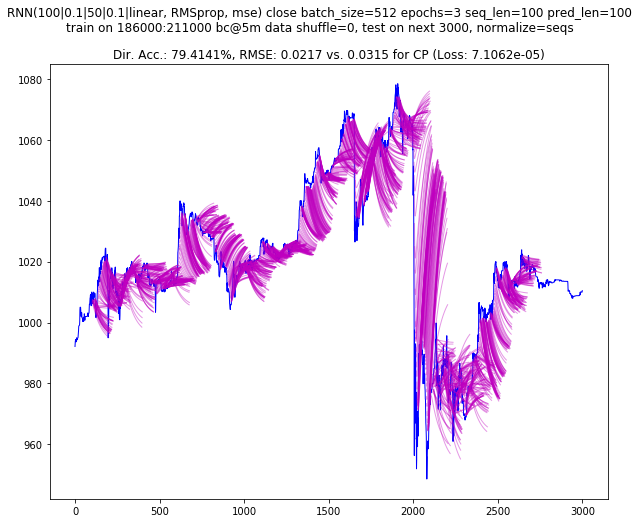

--- 451.954s to run segment


   ------ RUN 214000 (from 189000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236916928144
Tensor("lstm_135_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_135 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_135 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_136 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_136 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_68 (Dense)             (None, 1)         

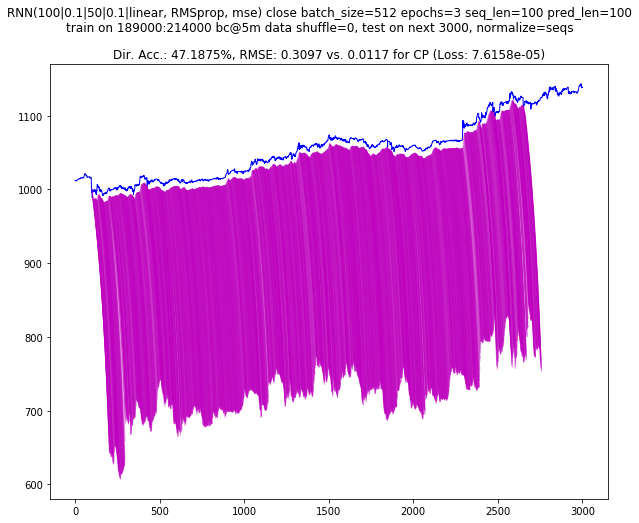

--- 459.462s to run segment


   ------ RUN 217000 (from 192000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140237318242192
Tensor("lstm_137_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_137 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_137 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_138 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_138 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_69 (Dense)             (None, 1)         

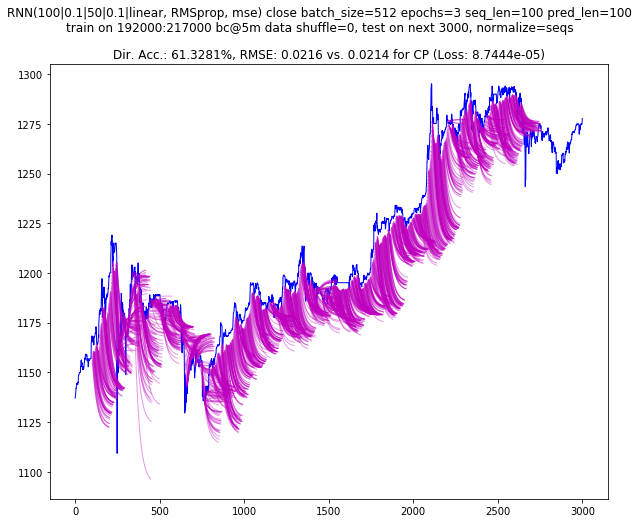

--- 454.973s to run segment


   ------ RUN 220000 (from 195000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.018s to model compilation time


--- Created model id: 140237558640912
Tensor("lstm_139_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_139 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_139 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_140 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_140 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_70 (Dense)             (None, 1)         

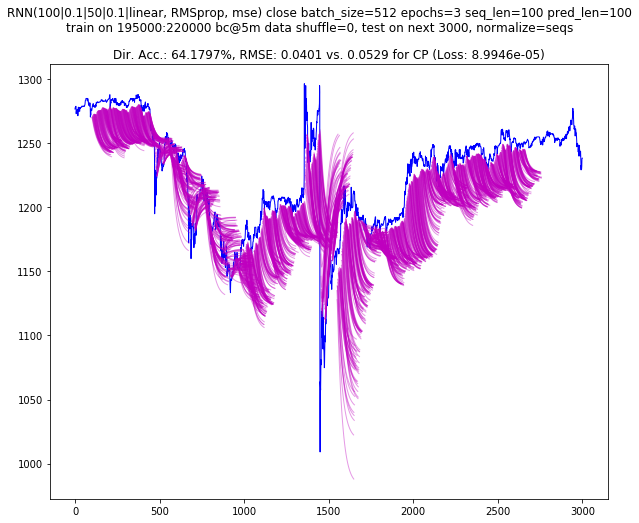

--- 455.410s to run segment


   ------ RUN 223000 (from 198000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237167021392
Tensor("lstm_141_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_141 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_141 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_142 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_142 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_71 (Dense)             (None, 1)         

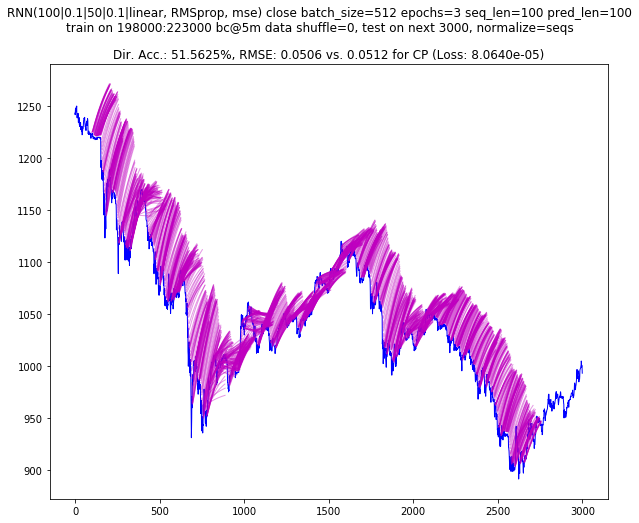

--- 454.990s to run segment


   ------ RUN 226000 (from 201000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237029235536
Tensor("lstm_143_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_143 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_143 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_144 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_144 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_72 (Dense)             (None, 1)         

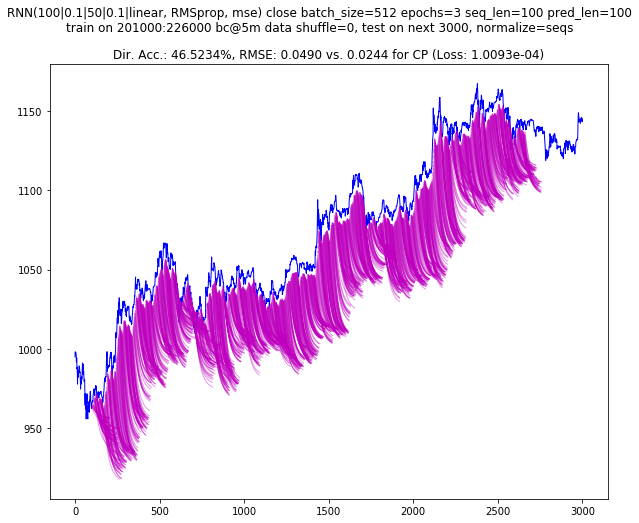

--- 452.875s to run segment


   ------ RUN 229000 (from 204000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236922522448
Tensor("lstm_145_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_145 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_145 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_146 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_146 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_73 (Dense)             (None, 1)         

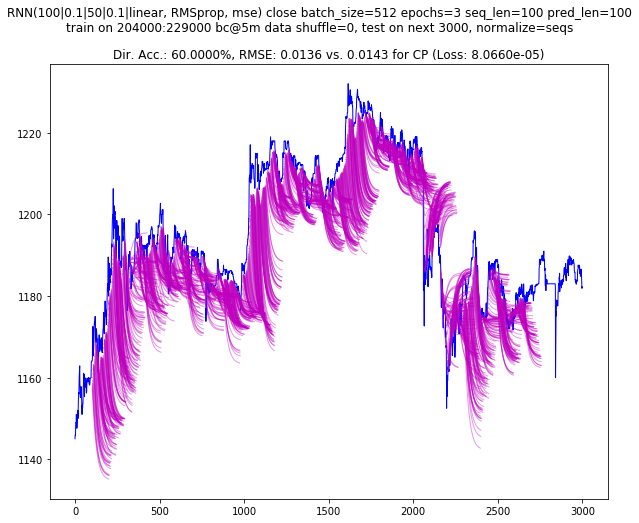

--- 453.487s to run segment


   ------ RUN 232000 (from 207000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236812749136
Tensor("lstm_147_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_147 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_147 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_148 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_148 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_74 (Dense)             (None, 1)         

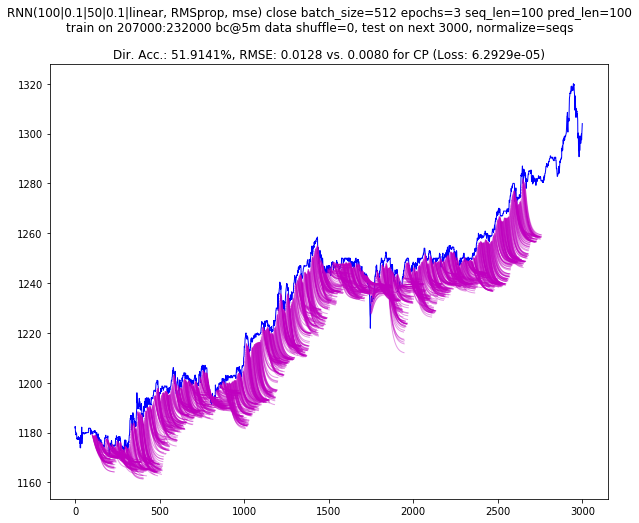

--- 457.602s to run segment


   ------ RUN 235000 (from 210000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236759274128
Tensor("lstm_149_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_149 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_149 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_150 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_150 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_75 (Dense)             (None, 1)         

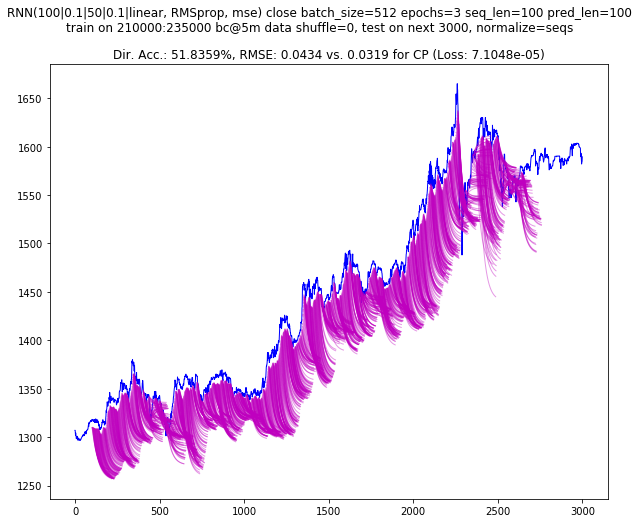

--- 456.477s to run segment


   ------ RUN 238000 (from 213000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236699061328
Tensor("lstm_151_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_151 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_151 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_152 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_152 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_76 (Dense)             (None, 1)         

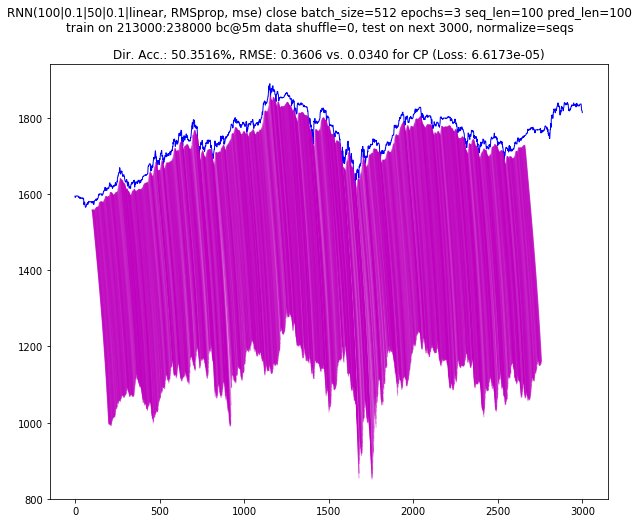

--- 455.952s to run segment


   ------ RUN 241000 (from 216000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236644333648
Tensor("lstm_153_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_153 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_153 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_154 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_154 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_77 (Dense)             (None, 1)         

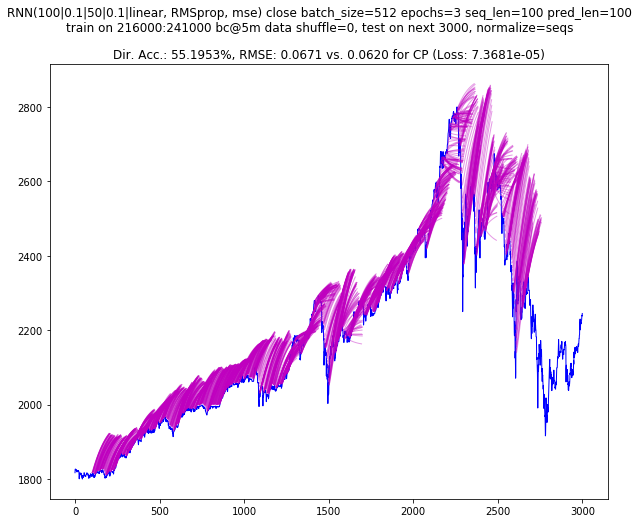

--- 462.868s to run segment


   ------ RUN 244000 (from 219000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140237558844368
Tensor("lstm_155_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_155 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_155 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_156 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_156 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_78 (Dense)             (None, 1)         

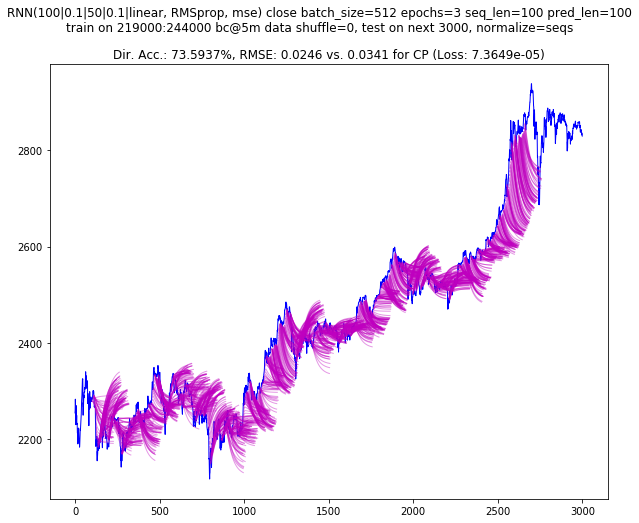

--- 456.495s to run segment


   ------ RUN 247000 (from 222000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140237047008272
Tensor("lstm_157_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_157 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_157 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_158 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_158 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_79 (Dense)             (None, 1)         

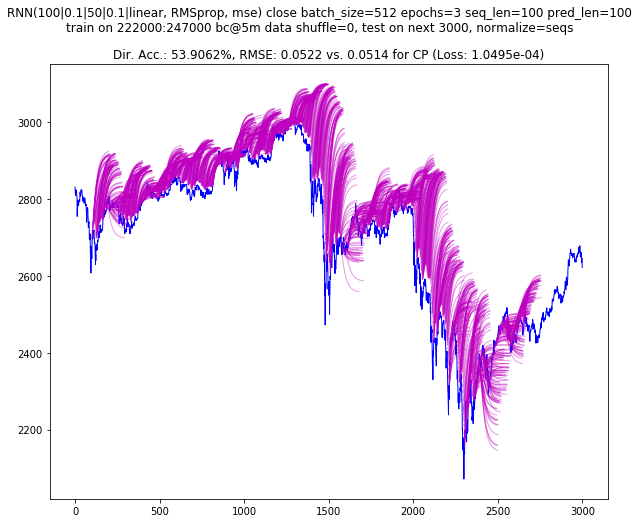

--- 454.557s to run segment


   ------ RUN 250000 (from 225000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236879244176
Tensor("lstm_159_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_159 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_159 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_160 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_160 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_80 (Dense)             (None, 1)         

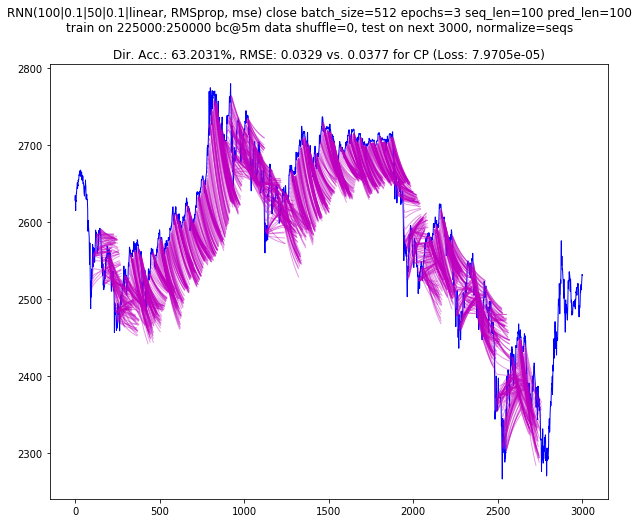

--- 458.458s to run segment


   ------ RUN 253000 (from 228000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236775217168
Tensor("lstm_161_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_161 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_161 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_162 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_162 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_81 (Dense)             (None, 1)         

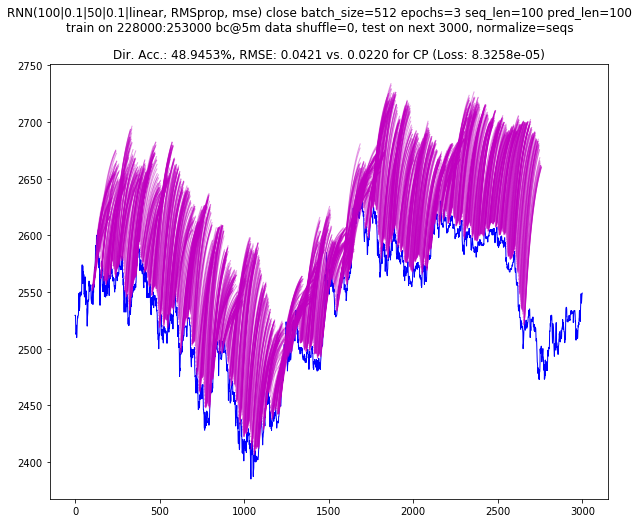

--- 455.178s to run segment


   ------ RUN 256000 (from 231000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236666720080
Tensor("lstm_163_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_163 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_163 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_164 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_164 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_82 (Dense)             (None, 1)         

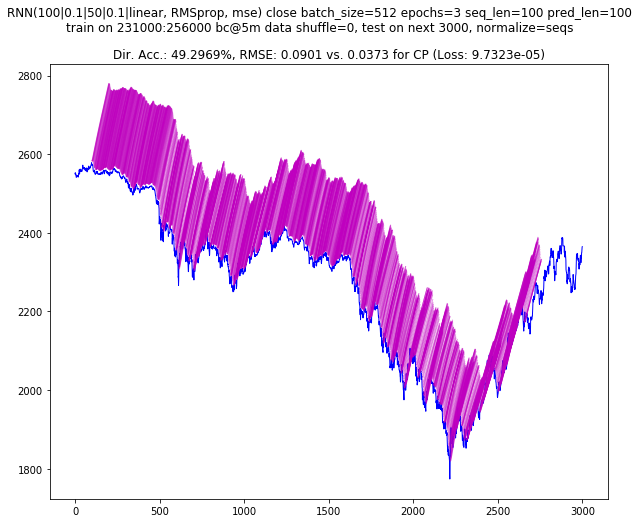

--- 462.473s to run segment


   ------ RUN 259000 (from 234000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236605064208
Tensor("lstm_165_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_165 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_165 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_166 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_166 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_83 (Dense)             (None, 1)         

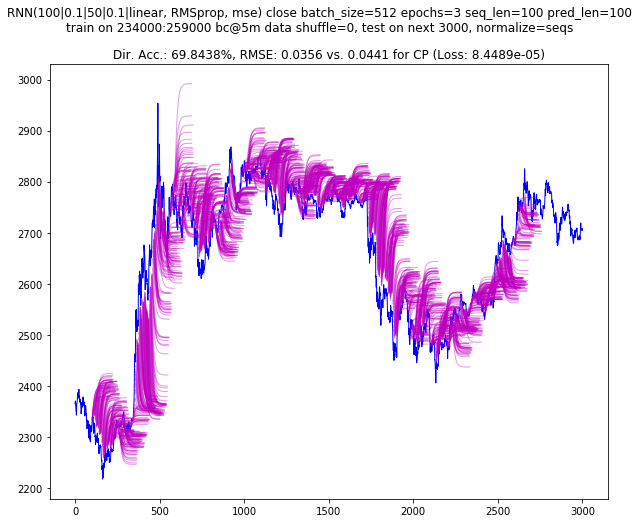

--- 457.032s to run segment


   ------ RUN 262000 (from 237000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236553532624
Tensor("lstm_167_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_167 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_167 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_168 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_168 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_84 (Dense)             (None, 1)         

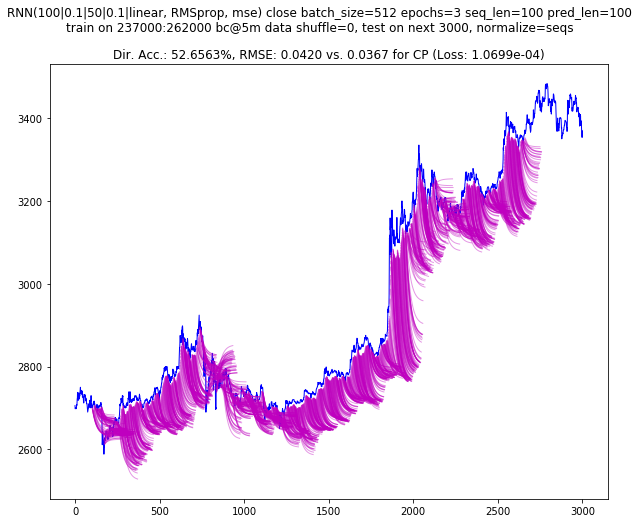

--- 459.386s to run segment


   ------ RUN 265000 (from 240000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236493298704
Tensor("lstm_169_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_169 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_169 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_170 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_170 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_85 (Dense)             (None, 1)         

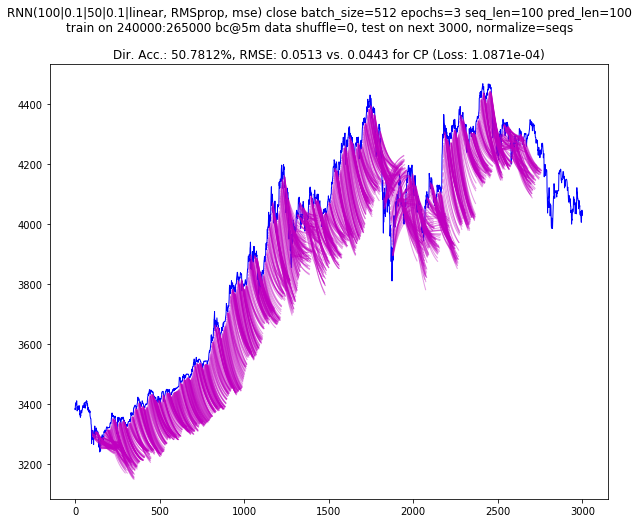

--- 460.896s to run segment


   ------ RUN 268000 (from 243000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236438564496
Tensor("lstm_171_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_171 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_171 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_172 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_172 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_86 (Dense)             (None, 1)         

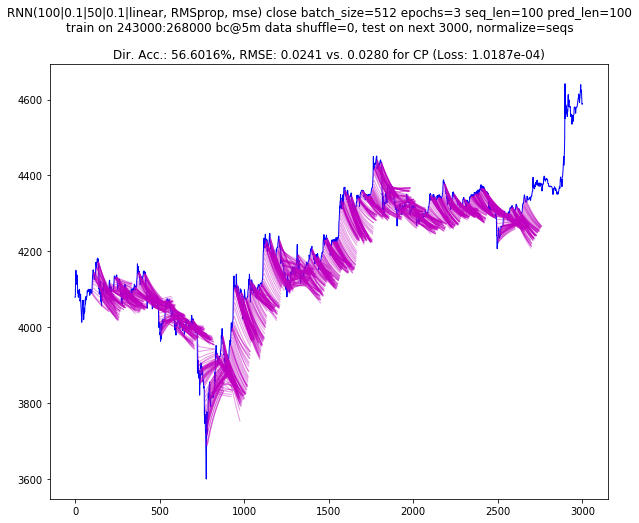

--- 464.644s to run segment


   ------ RUN 271000 (from 246000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236670672656
Tensor("lstm_173_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_173 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_173 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_174 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_174 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_87 (Dense)             (None, 1)         

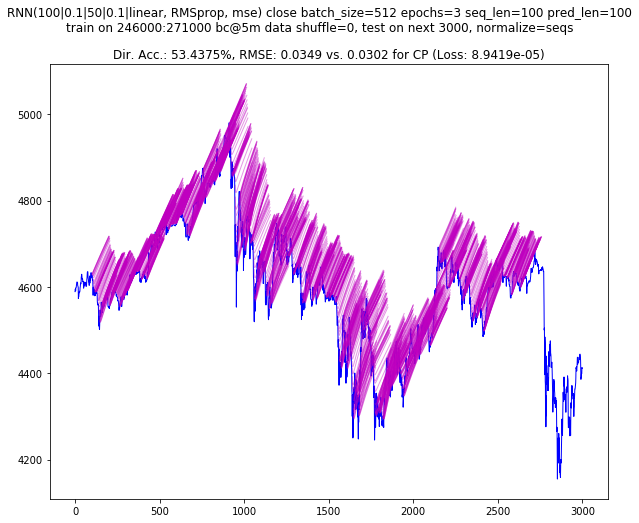

--- 459.529s to run segment


   ------ RUN 274000 (from 249000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236889820176
Tensor("lstm_175_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_175 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_175 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_176 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_176 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_88 (Dense)             (None, 1)         

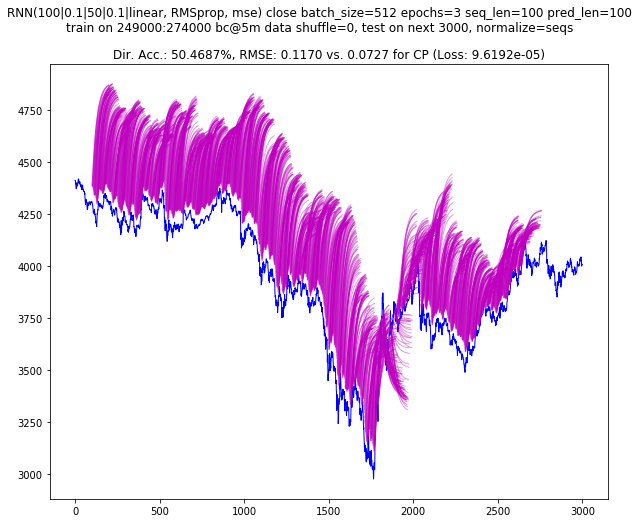

--- 457.385s to run segment


   ------ RUN 277000 (from 252000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236704787536
Tensor("lstm_177_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_177 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_177 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_178 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_178 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_89 (Dense)             (None, 1)         

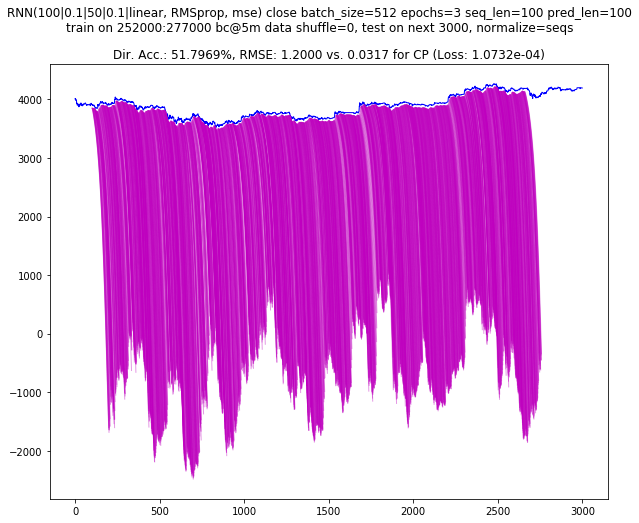

--- 484.968s to run segment


   ------ RUN 280000 (from 255000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.017s to model compilation time


--- Created model id: 140236566932752
Tensor("lstm_179_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_179 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_179 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_180 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_180 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_90 (Dense)             (None, 1)         

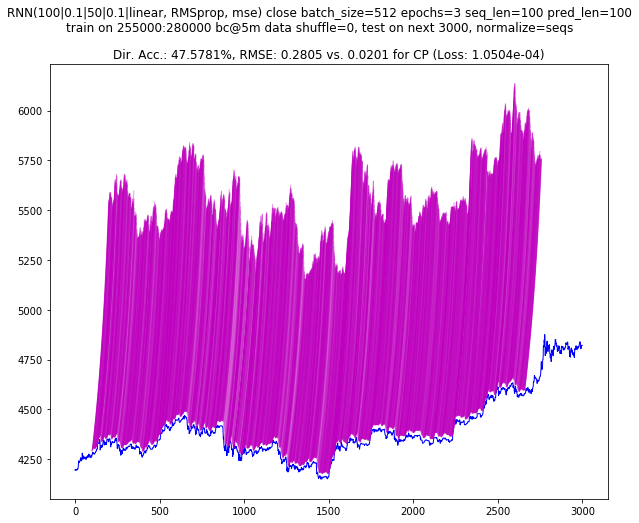

--- 477.362s to run segment


   ------ RUN 283000 (from 258000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236462351824
Tensor("lstm_181_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_181 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_181 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_182 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_182 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_91 (Dense)             (None, 1)         

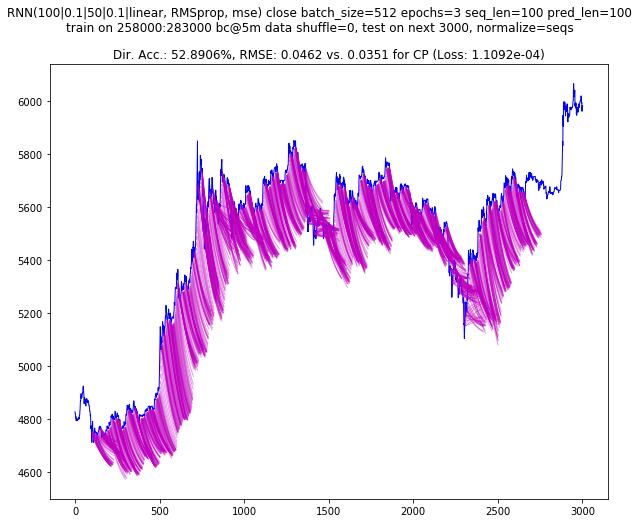

--- 479.240s to run segment


   ------ RUN 286000 (from 261000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236401383632
Tensor("lstm_183_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_183 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_183 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_184 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_184 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_92 (Dense)             (None, 1)         

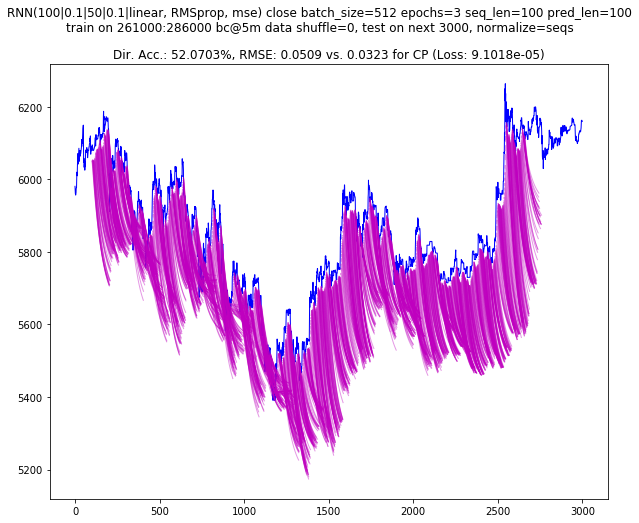

--- 479.181s to run segment


   ------ RUN 289000 (from 264000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236347921168
Tensor("lstm_185_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_185 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_185 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_186 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_186 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_93 (Dense)             (None, 1)         

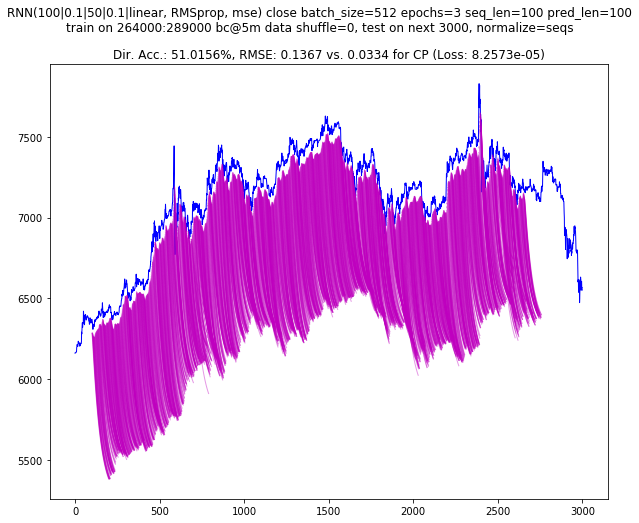

--- 479.283s to run segment


   ------ RUN 292000 (from 267000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236287130576
Tensor("lstm_187_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_187 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_187 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_188 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_188 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_94 (Dense)             (None, 1)         

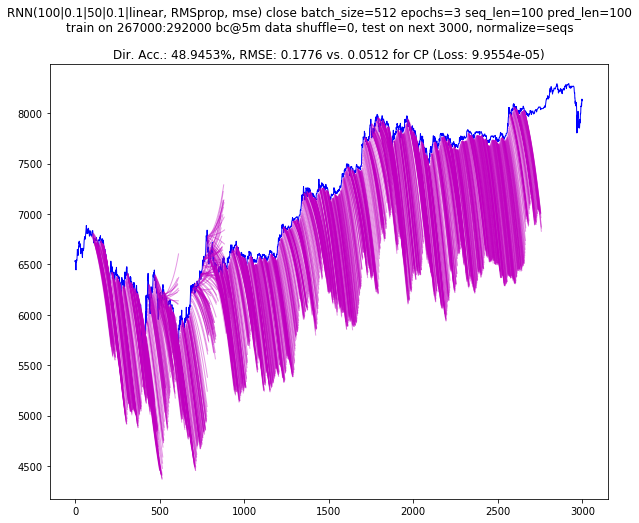

--- 482.553s to run segment


   ------ RUN 295000 (from 270000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236235786512
Tensor("lstm_189_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_189 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_189 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_190 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_190 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_95 (Dense)             (None, 1)         

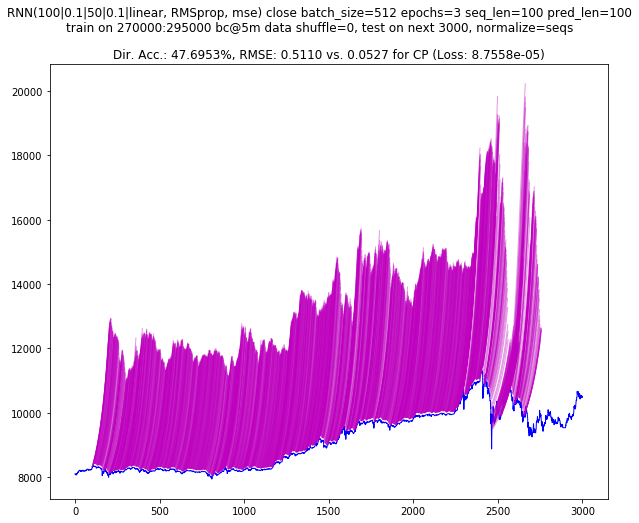

--- 488.407s to run segment


   ------ RUN 298000 (from 273000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236695291344
Tensor("lstm_191_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_191 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_191 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_192 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_192 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_96 (Dense)             (None, 1)         

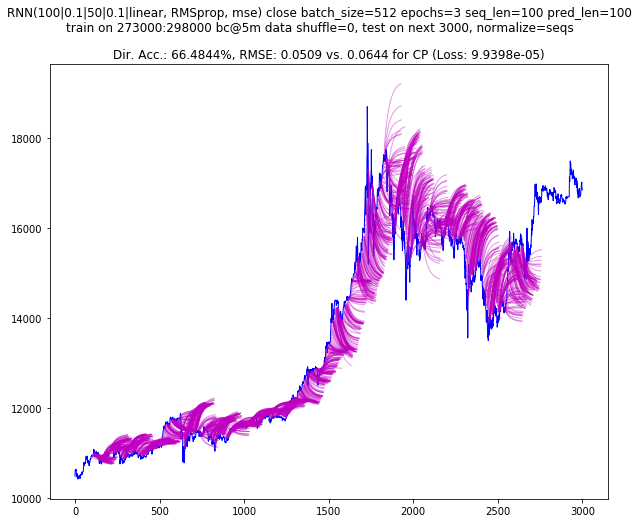

--- 484.129s to run segment


   ------ RUN 301000 (from 276000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236375902160
Tensor("lstm_193_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_193 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_193 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_194 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_194 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_97 (Dense)             (None, 1)         

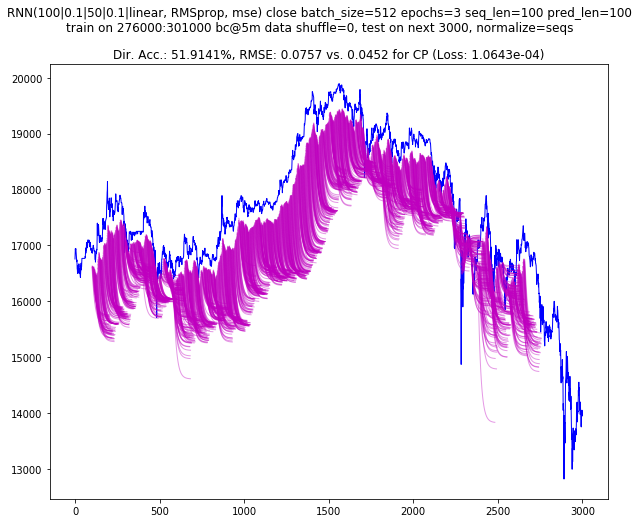

--- 483.435s to run segment


   ------ RUN 304000 (from 279000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236714551696
Tensor("lstm_195_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_195 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_195 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_196 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_196 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_98 (Dense)             (None, 1)         

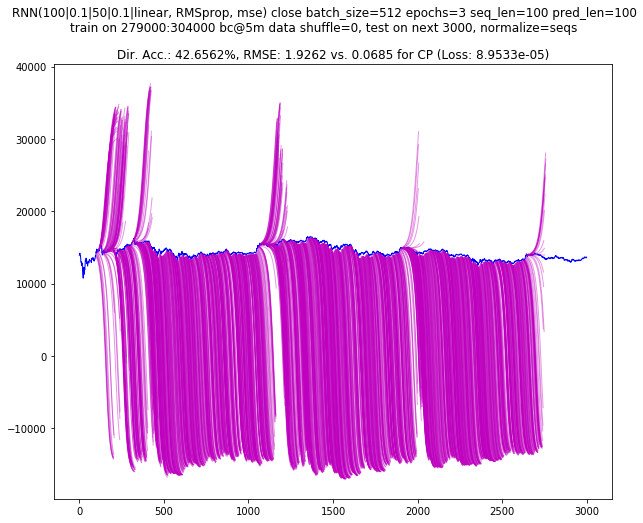

--- 485.025s to run segment


   ------ RUN 307000 (from 282000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236499605456
Tensor("lstm_197_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_197 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_197 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_198 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_198 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_99 (Dense)             (None, 1)         

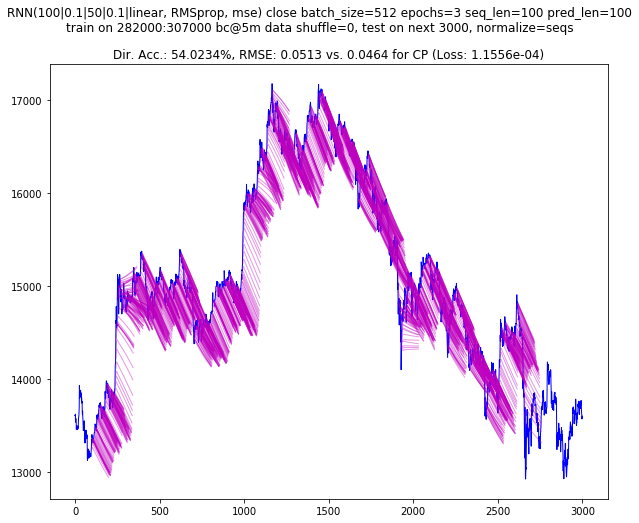

--- 486.053s to run segment


   ------ RUN 310000 (from 285000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236359875856
Tensor("lstm_199_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_199 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_199 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_200 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_200 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_100 (Dense)            (None, 1)         

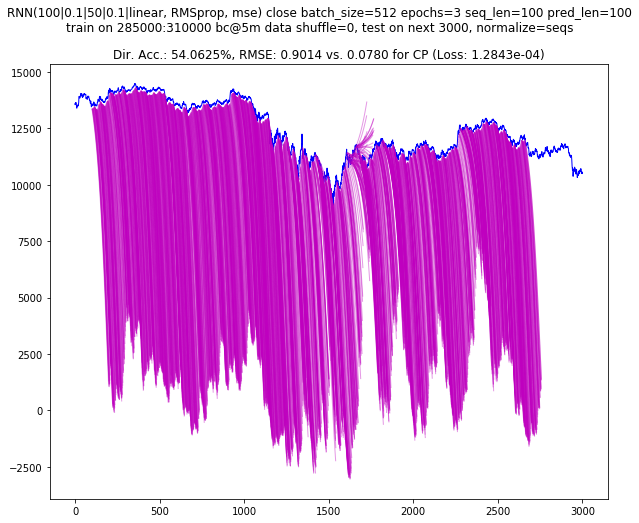

--- 462.859s to run segment


   ------ RUN 313000 (from 288000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236254042896
Tensor("lstm_201_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_201 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_201 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_202 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_202 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_101 (Dense)            (None, 1)         

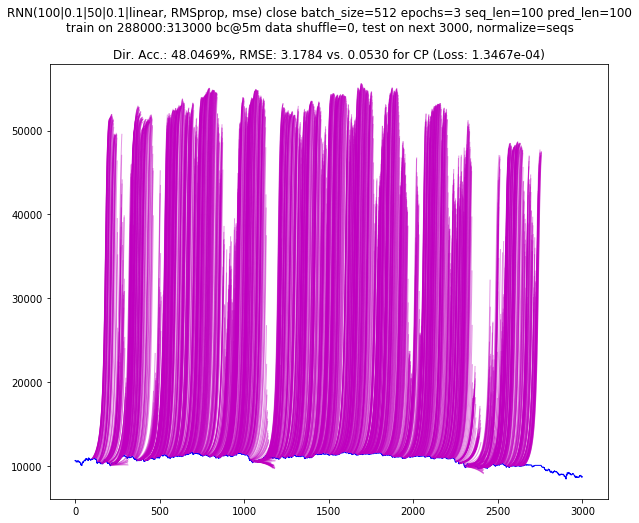

--- 466.371s to run segment


   ------ RUN 316000 (from 291000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236138723856
Tensor("lstm_203_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_203 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_203 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_204 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_204 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_102 (Dense)            (None, 1)         

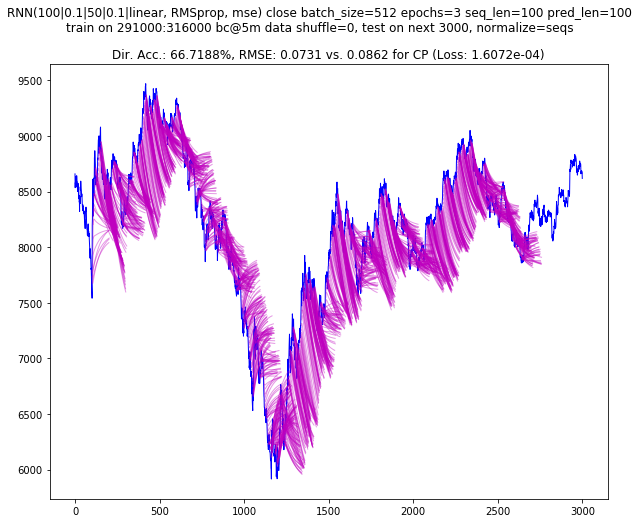

--- 465.411s to run segment


   ------ RUN 319000 (from 294000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236081397648
Tensor("lstm_205_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_205 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_205 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_206 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_206 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_103 (Dense)            (None, 1)         

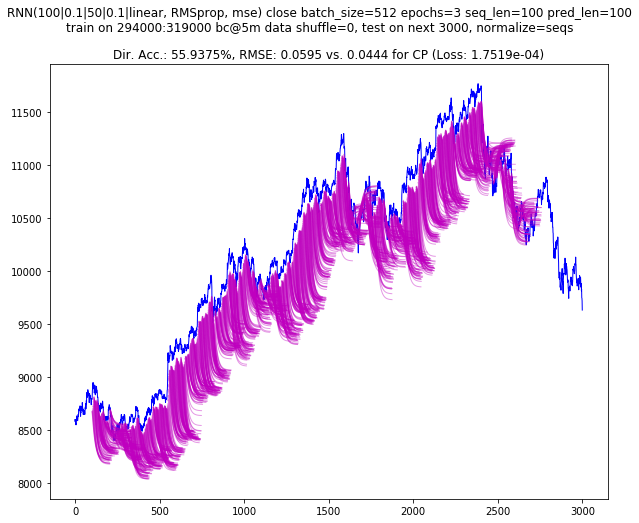

--- 463.984s to run segment


   ------ RUN 322000 (from 297000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236026703376
Tensor("lstm_207_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_207 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_207 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_208 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_208 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_104 (Dense)            (None, 1)         

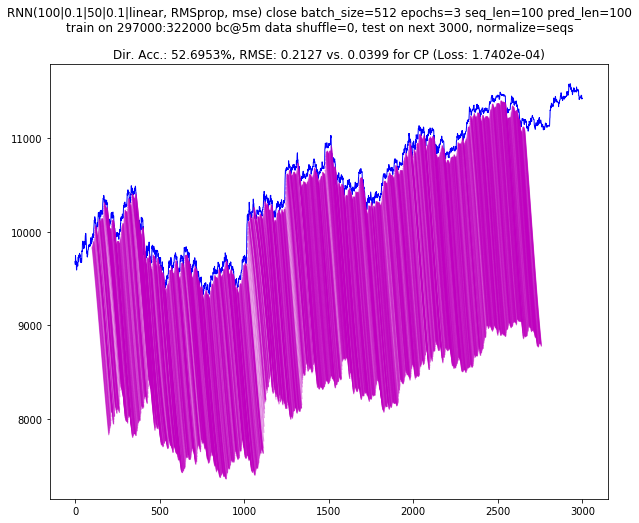

--- 466.314s to run segment


   ------ RUN 325000 (from 300000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140235969849616
Tensor("lstm_209_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_209 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_209 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_210 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_210 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_105 (Dense)            (None, 1)         

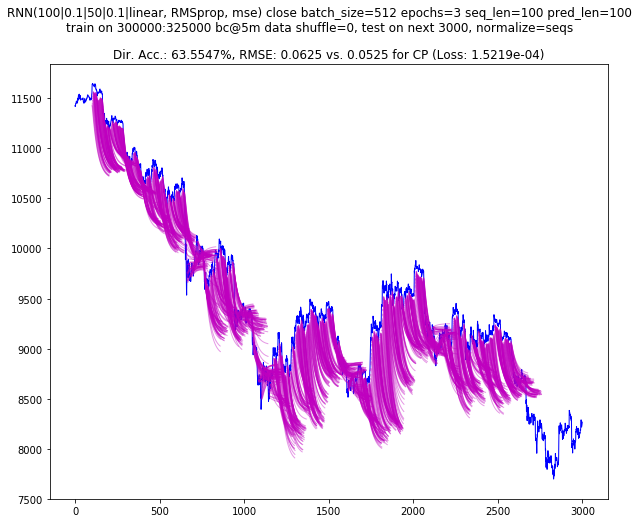

--- 461.053s to run segment

--- 22232.441s to full run 184000 - 328000



In [49]:
start_at = 184000
full_run(
    start_at,
    start_at + 3000 * 8 * 6,
)


   ------ RUN 328000 (from 303000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140235910607888
Tensor("lstm_211_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_211 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_211 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_212 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_212 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_106 (Dense)            (None, 1)                 51        
Total para

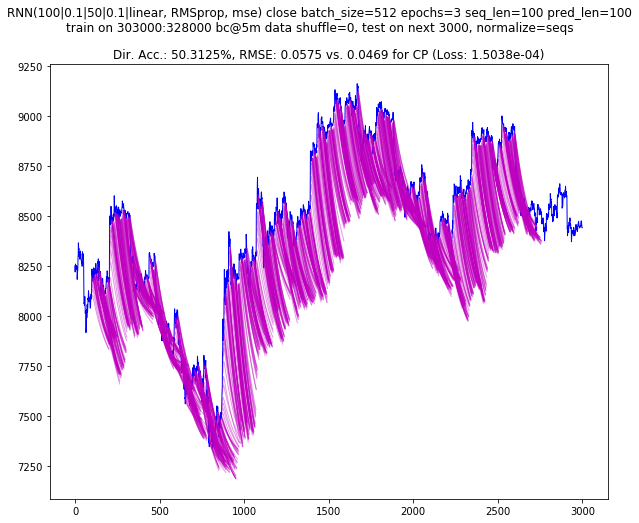

--- 466.496s to run segment


   ------ RUN 331000 (from 306000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140235857840080
Tensor("lstm_213_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_213 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_213 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_214 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_214 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_107 (Dense)            (None, 1)         

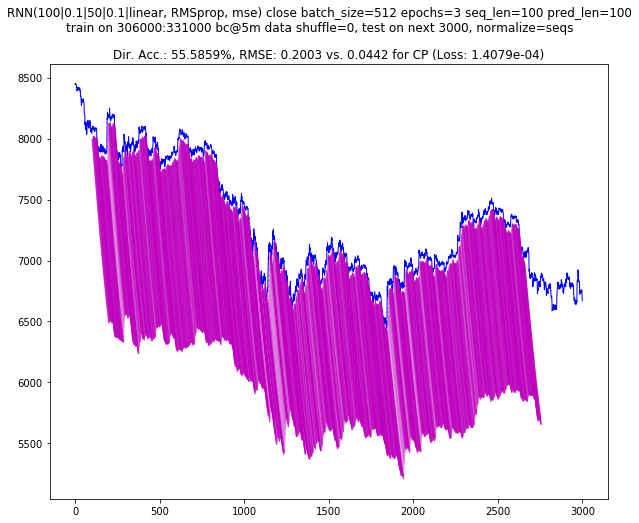

--- 475.310s to run segment


   ------ RUN 334000 (from 309000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236309834832
Tensor("lstm_215_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_215 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_215 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_216 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_216 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_108 (Dense)            (None, 1)         

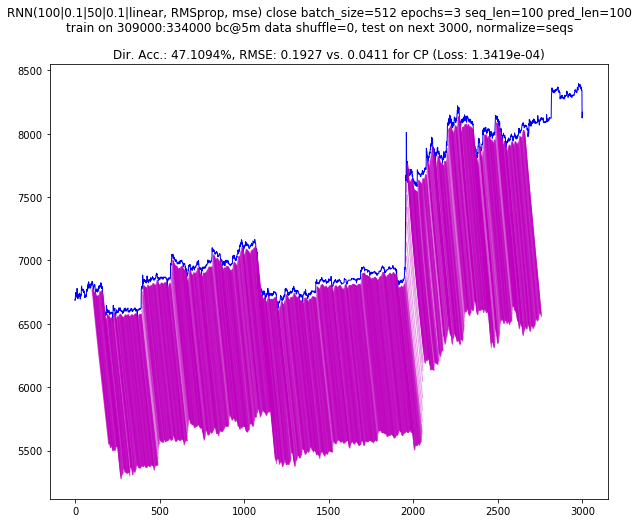

--- 467.623s to run segment


   ------ RUN 337000 (from 312000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.016s to model compilation time


--- Created model id: 140236716870416
Tensor("lstm_217_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_217 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_217 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_218 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_218 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_109 (Dense)            (None, 1)         

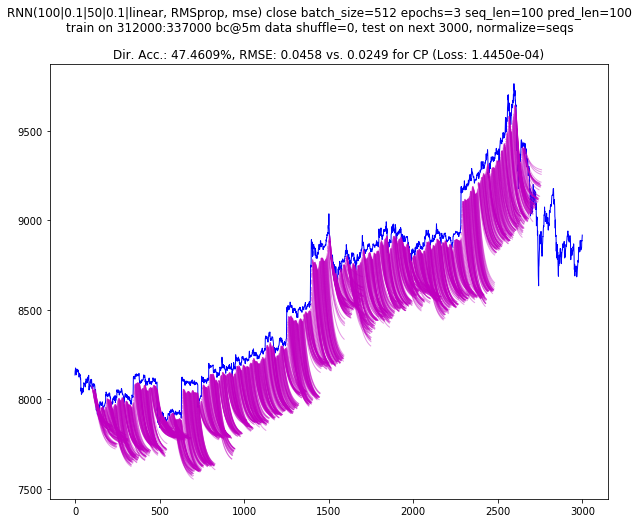

--- 466.447s to run segment


   ------ RUN 340000 (from 315000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236366428304
Tensor("lstm_219_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_219 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_219 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_220 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_220 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_110 (Dense)            (None, 1)         

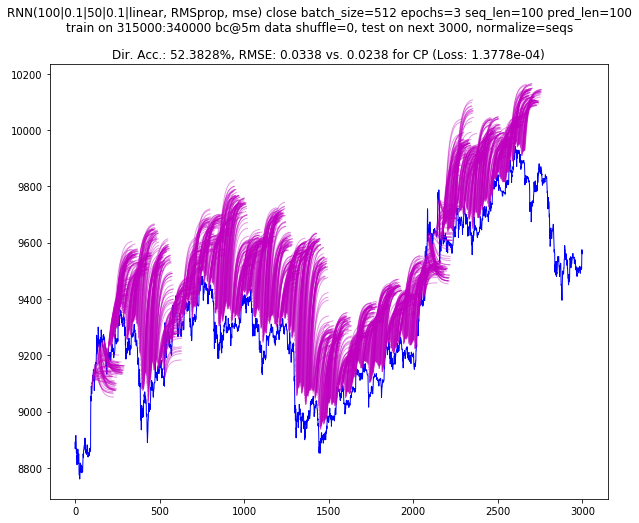

--- 471.295s to run segment


   ------ RUN 343000 (from 318000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236185348432
Tensor("lstm_221_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_221 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_221 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_222 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_222 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_111 (Dense)            (None, 1)         

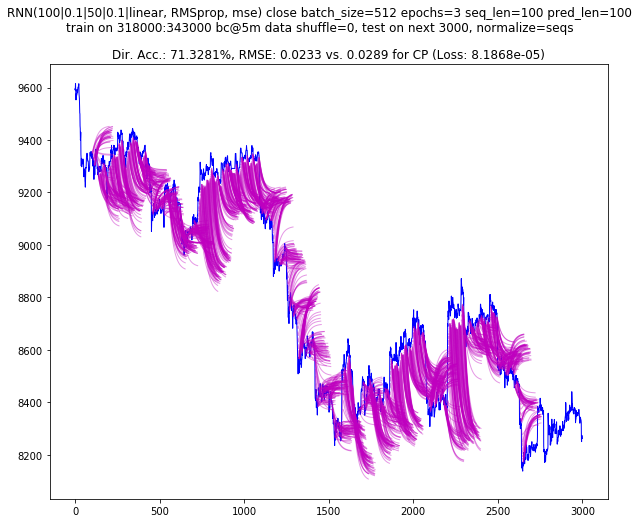

--- 466.375s to run segment


   ------ RUN 346000 (from 321000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140236091748560
Tensor("lstm_223_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_223 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_223 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_224 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_224 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_112 (Dense)            (None, 1)         

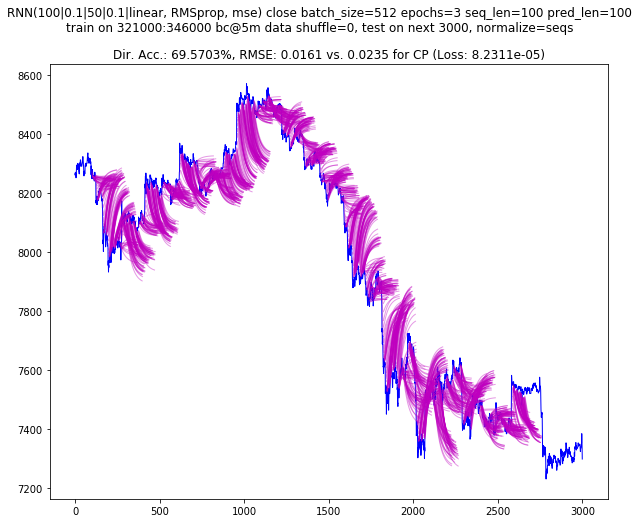

--- 466.018s to run segment


   ------ RUN 349000 (from 324000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140235990665424
Tensor("lstm_225_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_225 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_225 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_226 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_226 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_113 (Dense)            (None, 1)         

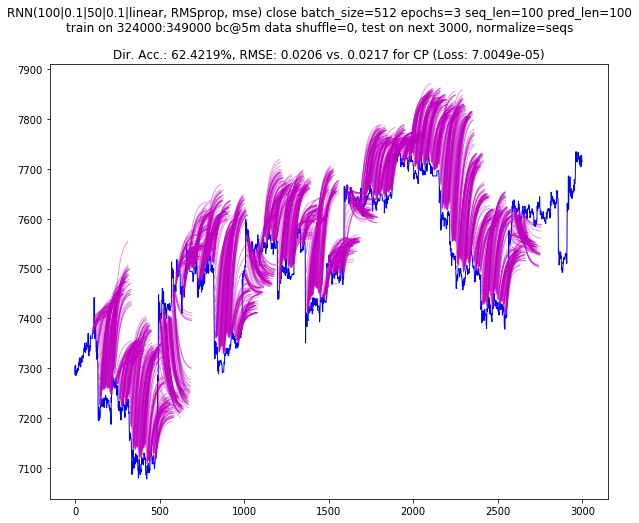

--- 465.804s to run segment


   ------ RUN 352000 (from 327000, train on 25000, test on 3000)

data ~ (28000, 1)
train_sz = 25000

seqs ~ (27899, 101, 1)
--- 0.015s to model compilation time


--- Created model id: 140235877837136
Tensor("lstm_227_input:0", shape=(?, 100, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_227 (LSTM)              (None, 100, 100)          40800     
_________________________________________________________________
dropout_227 (Dropout)        (None, 100, 100)          0         
_________________________________________________________________
lstm_228 (LSTM)              (None, 50)                30200     
_________________________________________________________________
dropout_228 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_114 (Dense)            (None, 1)         

In [ ]:
# end: 387948
start_at = 328000
full_run(
    start_at,
    len(data5m),
)

In [51]:
(328000 - len(data5m)) / (3000 * 8)

-2.4978333333333333

## Summary

In [6]:
results = pd.read_csv(OUT_FILENAME)
print("> size:", len(results))
dd(results.dtypes)
dd(results.head())
dd(results.tail())

> size: 121


model_description    object
train_from            int64
train_to              int64
test_on               int64
shuffle                bool
normalize            object
training_loss        object
rmse                 object
rmse_cp              object
dir_acc              object
dtype: object

,model_description,train_from,train_to,test_on,shuffle,normalize,training_loss,rmse,rmse_cp,dir_acc
0,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",0,25000,3000,False,seqs,6.9166e-05),0.0378%,0.0173%,49.0234%
1,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",3000,28000,3000,False,seqs,5.5009e-05),0.0288%,0.0122%,49.2969%
2,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",3000,28000,3000,False,seqs,5.6169e-05),0.0312%,0.0122%,48.3594%
3,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",6000,31000,3000,False,seqs,5.0547e-05),0.0482%,0.0085%,50.6250%
4,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",9000,34000,3000,False,seqs,4.7577e-05),0.0232%,0.0104%,51.5625%


,model_description,train_from,train_to,test_on,shuffle,normalize,training_loss,rmse,rmse_cp,dir_acc
116,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",345000,370000,3000,False,seqs,5.2116e-05),0.0526%,0.0322%,53.6328%
117,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",348000,373000,3000,False,seqs,4.9880e-05),0.1750%,0.0242%,52.1875%
118,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",351000,376000,3000,False,seqs,5.1821e-05),0.0202%,0.0251%,64.1016%
119,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",354000,379000,3000,False,seqs,5.7188e-05),0.0159%,0.0166%,63.5938%
120,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",357000,382000,3000,False,seqs,6.0764e-05),0.0127%,0.0164%,68.2813%


In [7]:
results['dir_acc'] = results.dir_acc.str.replace('%', '').astype(float)
dd(results.dtypes)
results.head()

model_description     object
train_from             int64
train_to               int64
test_on                int64
shuffle                 bool
normalize             object
training_loss         object
rmse                  object
rmse_cp               object
dir_acc              float64
dtype: object

,model_description,train_from,train_to,test_on,shuffle,normalize,training_loss,rmse,rmse_cp,dir_acc
0,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",0,25000,3000,False,seqs,6.9166e-05),0.0378%,0.0173%,49.0234
1,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",3000,28000,3000,False,seqs,5.5009e-05),0.0288%,0.0122%,49.2969
2,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",3000,28000,3000,False,seqs,5.6169e-05),0.0312%,0.0122%,48.3594
3,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",6000,31000,3000,False,seqs,5.0547e-05),0.0482%,0.0085%,50.6250
4,"RNN(100|0.1|50|0.1|linear, RMSprop, mse) close...",9000,34000,3000,False,seqs,4.7577e-05),0.0232%,0.0104%,51.5625


In [11]:
print("> whole data dir_acc mean:", results.dir_acc.mean())
print("> last 50% dir_acc mean:", results[int(len(results) / 2):].dir_acc.mean())
print("> last 25% dir_acc mean:", results[int(len(results) * 3 / 4):].dir_acc.mean())
print("> last 10% dir_acc mean:", results[int(len(results) * 0.9):].dir_acc.mean())

> whole data dir_acc mean: 56.36815619834711
> last 50% dir_acc mean: 55.68199344262296
> last 25% dir_acc mean: 55.80015483870969
> last 10% dir_acc mean: 57.91467692307692


## Conclusion

The estimated "minimum prediction accuracy that could constitute the basis of a practically profitable trading strategy at 100 points ahead" was not reached.